# Angular Response of the detector

In [3]:
import numpy as np
#import jax.numpy as np
from numpy import cos, sin, pi, sqrt, arctan2
from nest import detectors as det
from nest import pls
import matplotlib.pyplot as plt
import healpy as hp
from healpy.newvisufunc import projview, newprojplot
from multiprocessing import Pool
from concurrent.futures import ProcessPoolExecutor, as_completed
from tqdm import tqdm
from numba import  jit
from scipy.integrate import simpson
from nest import overlap,  pls, skymap, nell
from scipy.special import sph_harm
from mpmath import spherharm
from scipy.interpolate import interp1d  
from astropy.cosmology import Planck15

cosmo = Planck15
H0 =  cosmo.H0.to('1/s').value

c = 299792458 #m/s

plt.rcParams['figure.dpi'] = 300
plt.rcParams['font.size'] = 20
plt.rcParams['axes.labelsize'] = 20
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
plt.rcParams['legend.fontsize'] = 20
plt.rcParams['lines.linewidth'] = 3

Basis

In [4]:
@jit
def u_v_Omega_basis(theta, phi):
    # Construct each component as a 2D array first
    u0 = np.cos(theta) * np.cos(phi)
    u1 = np.cos(theta) * np.sin(phi)
    u2 = -np.sin(theta)

    v0 = -np.sin(phi)
    v1 = np.cos(phi)
    v2 = np.zeros_like(phi)  # Ensures v has the same shape as u and Omega

    Omega0 = np.sin(theta) * np.cos(phi)
    Omega1 = np.sin(theta) * np.sin(phi)
    Omega2 = np.cos(theta)

    # Now, stack the components along a new axis to create 3D arrays
    u = np.stack((u0, u1, u2), axis=0)
    v = np.stack((v0, v1, v2), axis=0)
    Omega = np.stack((Omega0, Omega1, Omega2), axis=0)

    return u, v, Omega

def Omega(theta, phi):
    return u_v_Omega_basis(theta, phi)[2]

@jit
def m_n_Omega_basis(theta, phi, psi):
    u, v, Omega = u_v_Omega_basis(theta, phi)
    m = u*np.cos(psi) + v*np.sin(psi)
    n = -u*np.sin(psi) + v*np.cos(psi)
    return m, n, Omega

Polarization tensors

In [5]:
def e_pol(theta, phi, psi): #polarization tensors    
    m, n, Omega = m_n_Omega_basis(theta, phi, psi)
    e_plus = np.einsum('iab,jab->ijab', m, m)- np.einsum('iab,jab->ijab', n, n)
    e_cross = np.einsum('iab,jab->ijab',m, n) + np.einsum('iab,jab->ijab',n, m)
    e_x = np.einsum('iab,jab->ijab',m, Omega) + np.einsum('iab,jab->ijab',Omega, m)
    e_y = np.einsum('iab,jab->ijab',n, Omega) + np.einsum('iab,jab->ijab',Omega, n)
    e_b = np.einsum('iab,jab->ijab',m,m) + np.einsum('iab,jab->ijab',n,n)
    e_l = sqrt(2)*(np.einsum('iab,jab->ijab',Omega, Omega))
    return e_plus, e_cross, e_x, e_y, e_b, e_l

theta = np.linspace(0, pi, 100)
phi = np.linspace(0, 2*pi, 100)
psi = 0
theta, phi = np.meshgrid(theta, phi)

e_plus, e_cross, e_x, e_y, e_b, e_l = e_pol(theta, phi, psi)

print(e_plus.shape)

(3, 3, 100, 100)




Transfer function.
\begin{equation*}
\mathcal{T}(f,\hat{l}_{AB},\hat{n})=\frac{1}{2}\left[e^{ -\pi i f L (1+\hat{k}\cdot \hat{l}_{AB})} {\rm{sinc}}\left(f L (1+\hat{k}\cdot \hat{l}_{AB})\right)+ e^{ -\pi i f L (3+\hat{k}\cdot \hat{l}_{AB})} {\rm{sinc}}\left(f L (1-\hat{k}\cdot \hat{l}_{AB})\right)\right]
\end{equation*}

(1000, 100, 100)


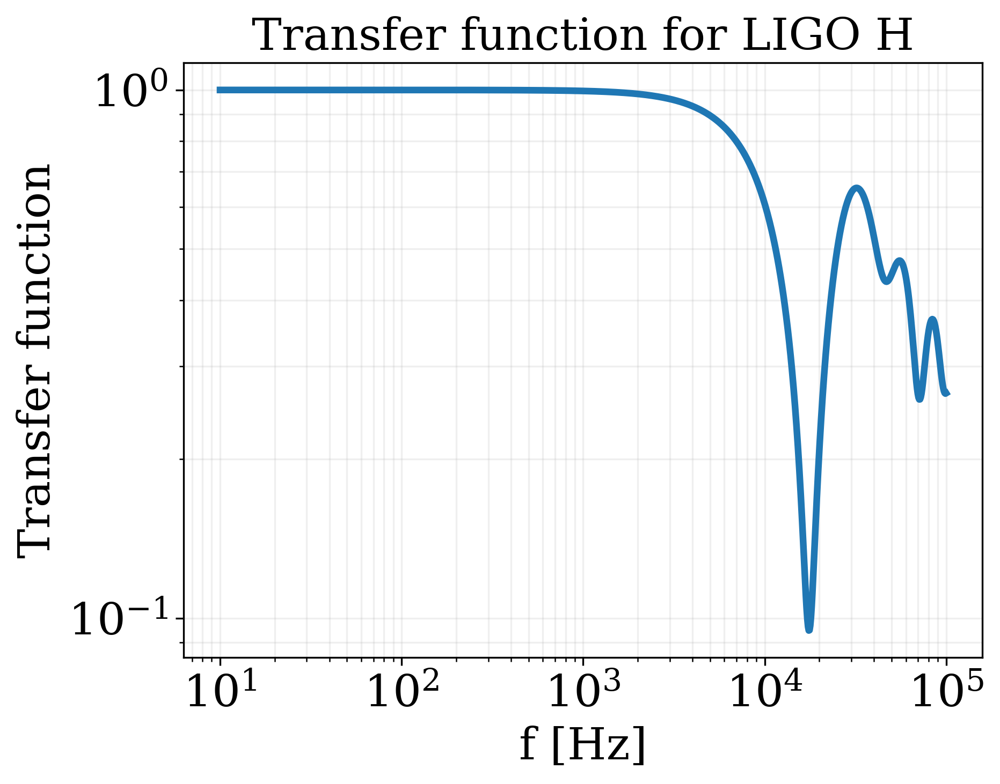

In [6]:
def transfer_function(L, e, f, theta, phi, psi):
    # Assicurarsi che f sia un array 2D con la stessa forma di theta e phi
    f = np.array(f).reshape((len(f), 1, 1))
    # Calcola la funzione di trasferimento
    omega = - m_n_Omega_basis(theta, phi, psi)[2]
    l = e
    exp3 = np.exp(-3j*pi*f*L/c*(1-np.einsum('iab,i->ab', omega, l)))
    exp1 = np.exp(-1j*pi*f*L/c*(1+np.einsum('iab,i->ab', omega, l)))
    sinc1 = np.sinc(f*L/c*(1-np.einsum('iab,i->ab', omega, l)))
    sinc3 = np.sinc(f*L/c*(1+np.einsum('iab,i->ab', omega, l)))
    return 0.5*(exp1*sinc1 + exp3*sinc3)

def get_tf(f, which_det, theta, phi, psi, shift_angle=None):
    c, u, v, l, det_name = det.detector(which_det, shift_angle)
    tf = transfer_function(l, u, f, theta, phi, psi)
    return tf

f = np.logspace(1, 5, 1000)
tf = get_tf(f, 'LIGO H', theta, phi, psi)
print(tf.shape)

plt.loglog(f, np.abs(tf[:, 0,0]))
plt.grid(True, which='both', alpha=0.2)
plt.xlabel('f [Hz]')
plt.ylabel('Transfer function')
plt.title('Transfer function for LIGO H')
plt.show()


(1000, 100, 100)


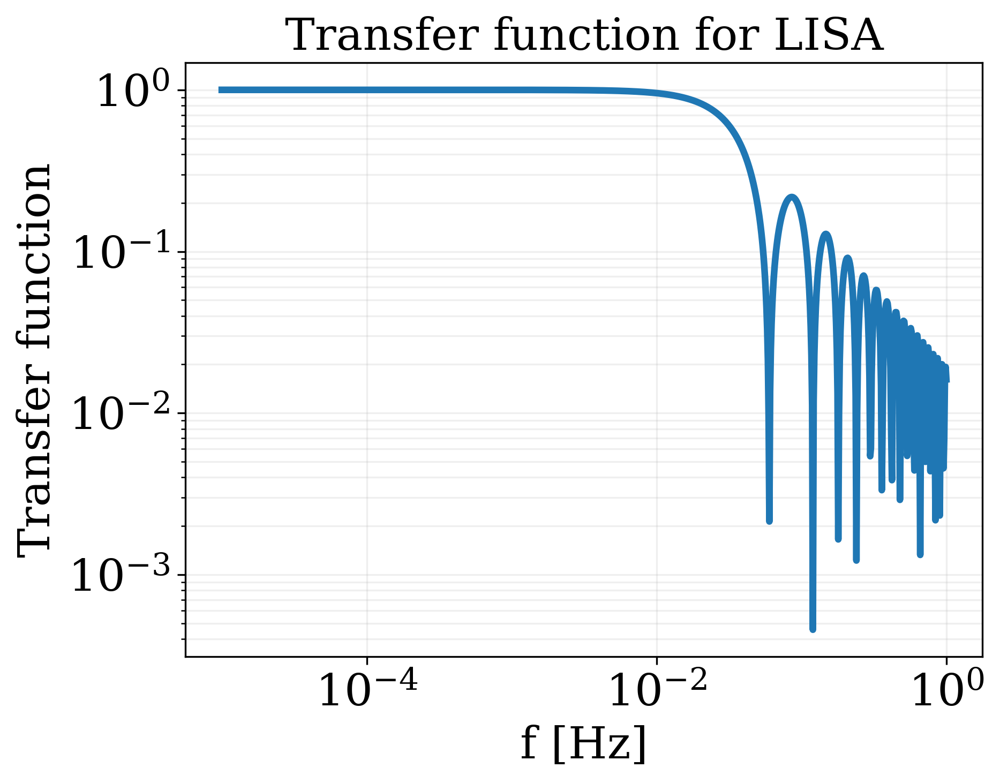

In [7]:
theta = np.linspace(0, pi, 100)
phi = np.linspace(0, 2*pi, 100)
theta, phi = np.meshgrid(theta, phi)

f = np.logspace(-5, 0, 1000)
tf = get_tf(f, 'LISA 1', theta, phi, 0)
print(tf.shape)

plt.loglog(f, np.abs(tf[:, 0,0]))
plt.grid(True, which='both', alpha=0.2)
plt.xlabel('f [Hz]')
plt.ylabel('Transfer function')
plt.title('Transfer function for LISA')
plt.show()

Detector Tensor

In [8]:
def D_tensor(e1, e2): #detector tensor in the small antenna limit
    return 0.5*(np.outer(e1, e1)- np.outer(e2, e2))

#example to check the shape
ecH, e1H, e2H, l, name = det.detector('LIGO H', None)
D = D_tensor(ecH, e1H)
print(D.shape)



def D_tensor_transfer(e1, e2, L, f, theta, phi, psi): #detector tensor
    tf1 = transfer_function(L, e1, f, theta, phi, psi)
    tf2 = transfer_function(L, e2, f, theta, phi, psi)
    out1 = np.einsum('i,j-> ij',e1, e1)
    out2 = np.einsum('i,j-> ij',e2, e2)
    p1 = np.einsum('ij, xab->ijxab', out1, tf1)
    p2 = np.einsum('ij, xab->ijxab', out2, tf2)
    D = 0.5*( p1 - p2)
    #D = tf1 - tf2
    return D

#example to check the shape
ecH, e1H, e2H, l, name = det.detector('LIGO H', None)
f = np.logspace(1, 3, 1000)
D = D_tensor_transfer(ecH, e1H, l, f, theta, phi, psi)
print(D.shape)


(3, 3)
(3, 3, 1000, 100, 100)


Angular Pattern Function

In [9]:
def F(theta, phi, psi, e1, e2): #angular pattern function
    e_plus, e_cross, e_x, e_y, e_b, e_l = e_pol(theta, phi, psi)
    D = D_tensor(e1, e2) #detector tensor with no transfer function
    F_plus = np.einsum('ij,ijab->ab', D, e_plus)
    F_cross = np.einsum('ij,ijab->ab', D, e_cross)
    F_x = np.einsum('ij,ijab->ab', D, e_x)
    F_y = np.einsum('ij,ijab->ab', D, e_y)
    F_b = np.einsum('ij,ijab->ab', D, e_b)
    F_l = np.einsum('ij,ijab->ab', D, e_l)
    return F_plus, F_cross, F_x, F_y, F_b, F_l 

def F_transfer(theta, phi, psi, e1, e2, f, L): #angular pattern function
    e_plus, e_cross, e_x, e_y, e_b, e_l = e_pol(theta, phi, psi)
    D = D_tensor_transfer(e1, e2, L, f, theta, phi, psi)  #detector tensor with transfer function
    F_plus = np.einsum('ijxab,ijab->xab', D, e_plus)
    F_cross = np.einsum('ijxab,ijab->xab', D, e_cross)
    F_x = np.einsum('ijxab,ijab->xab', D, e_x)
    F_y = np.einsum('ijxab,ijab->xab', D, e_y)
    F_b = np.einsum('ijxab,ijab->xab', D, e_b)
    F_l = np.einsum('ijxab,ijab->xab', D, e_l)
    return F_plus, F_cross, F_x, F_y, F_b, F_l 



Response function (overlap reduction function)


\begin{equation*}
    \mathcal{R}_{AA'}^{\ell m}(f) = \int \frac{d\Omega_{\vec {k}}}{4 \pi} \left[ \mathcal{F}_A^+(f,\hat{l}_{AB},\hat{l}_{AC},\hat{n}){\mathcal{F}_{A'}^+}^*(f,\hat{l}_{A'B'},\hat{l}_{A'C'},\hat{n}) + \mathcal{F}_A^{\times}(f,\hat{l}_{AB},\hat{l}_{AC},\hat{n}){\mathcal{F}_{A'}^{\times}}^*(f,\hat{l}_{A'B'},\hat{l}_{A'C'},\hat{n})\right]\, Y^{\ell, m}(\vec{k}),
\end{equation*}
with
\begin{equation*}
\mathcal{F}_A^P(f,\hat{l}_{AB},\hat{l}_{AC},\hat{n}) = e^{P}(\hat{k})_{ij} D^{ij}(\hat{k}, f, l_1, l_2)
\end{equation*}


In [10]:

def Rlm_integrand(l, m, x, y, psi, c1, u1, v1, c2, u2, v2, c, f, pol):
    F1 = F(x, y, psi, u1, v1)
    F2 = F(x, y, psi, u2, v2)
    d = c1 - c2
    omega = Omega(x, y)
    spherharm_vectorized = np.vectorize(spherharm)
    f = f.reshape(len(f), 1, 1)
    scal = np.einsum('i, ikl-> kl', d, omega)
    cos_term = np.cos(2*pi*f*(scal)/c)*sin(x)
    #print(cos_term.shape)
    if (pol == 't'):
        return (5/(8*pi))*(F1[0]*F2[0] + F1[1]*F2[1]) * cos_term * spherharm_vectorized(l, m, x, y)*np.sqrt(4*np.pi)
    elif (pol == 'v'):
        return (5/(8*pi))*(F1[2]*F2[2] + F1[3]*F2[3]) * cos_term * spherharm_vectorized(l, m, x, y)*np.sqrt(4*np.pi)
    elif (pol == 's'):
        return (15/(4*pi))*(F1[4]*F2[4]) * cos_term * spherharm_vectorized(l, m, x, y)*np.sqrt(4*np.pi)


def Rlm(l, m, u1, v1, c1, u2, v2, c2, psi, f, pol):
    x_values = np.linspace(0, pi, 100)
    y_values = np.linspace(0, 2*pi, 100)
    X, Y = np.meshgrid(x_values,y_values) 
    f_values = Rlm_integrand(l, m, X, Y, psi, c1, u1, v1, c2, u2, v2, c, f, pol)
    gamma_x = np.trapz(f_values, x_values.reshape(1, 100, 1), axis=1)
    gamma = np.trapz(gamma_x, y_values.reshape(1,1, 100))
    return gamma[0].real


#note: the part that takes into account the transfer function has been written with the LISA conventions
#       this means that instead of having a 5/8pi i have 1/4pi

def Rlm_integrand_transfer(l, m, x, y, psi, c1, u1, v1, c2, u2, v2, c, f, pol, L):
    F1 = F_transfer(x, y, psi, u1, v1, f, L)
    F2 = F_transfer(x, y, psi, u2, v2, f, L)
    d = c1 - c2
    omega = Omega(x, y)
    spherharm_vectorized = np.vectorize(spherharm)
    f = f.reshape(len(f), 1, 1)
    scal = np.einsum('i, ikl-> kl', d, omega)
    cos_term = np.cos(2*pi*f*(scal)/c)*sin(x)
    if (pol == 't'):
        return (5/(8*pi))*(F1[0]*np.conj(F2[0]) + F1[1]*np.conj(F2[1])) * cos_term * spherharm_vectorized(l, m, x, y)*np.sqrt(4*np.pi)
    elif (pol == 'v'):
        return (5/(8*pi))*(F1[2]*F2[2] + F1[3]*F2[3]) * cos_term * spherharm_vectorized(l, m, x, y)*np.sqrt(4*np.pi)
    elif (pol == 's'):
        return (15/(4*pi))*(F1[4]*F2[4]) * cos_term * spherharm_vectorized(l, m, x, y)*np.sqrt(4*np.pi)
    
def Rlm_transfer(l, m, u1, v1, c1, u2, v2, c2, psi, f, pol, L):
    x_values = np.linspace(0, pi, 100)
    y_values = np.linspace(0, 2*pi, 100)
    X, Y = np.meshgrid(x_values,y_values) 
    f_values = Rlm_integrand_transfer(l, m, X, Y, psi, c1, u1, v1, c2, u2, v2, c, f, pol, L)
    #print(f_values.shape)
    gamma_x = np.trapz(f_values, x_values.reshape(1, 100, 1), axis=1)
    gamma = np.trapz(gamma_x, y_values.reshape(1, 1, 100))
    return gamma[0].real

In [11]:
def R_ell(l, c1, u1, v1, c2, u2, v2, c, f, pol):
    m_values = np.arange(-l, l+1)
    total = 0
    psi = 0 
    for m in m_values:
        total += np.abs(Rlm(l, m, u1, v1, c1, u2, v2, c2, psi, f, pol))**2
    return np.sqrt(total)

def R_ell_transfer(l, c1, u1, v1, c2, u2, v2, c, f, pol, L):
    m_values = np.arange(-l, l+1)
    total = 0
    psi = 0 
    for m in m_values:
        total += np.abs(Rlm_transfer(l, m, u1, v1, c1, u2, v2, c2, psi, f, pol, L))**2
    return np.sqrt(total)

# **************************************************************************************************************


# LIGO

In [10]:
ecH, e1H, e2H, l, name = det.detector('LIGO H', shift_angle=None)
ecL, e1L, e2L, l, name = det.detector('LIGO L', shift_angle=None)

f = np.logspace(1,5, 100) 


#some checks 

R00_LIGO =               Rlm(0, 0, e1H, e2H, ecH, e1L, e2L, ecL, 0, f, 't')
R00_LIGO_auto =          Rlm_transfer(0, 0, e1H, e2H, ecH, e1H, e2H, ecH, 0, f, 't', l)

R0_LIGO =                R_ell(0, ecH, e1H, e2H, ecL, e1L, e2L, c, f, 't')
R_0_LIGO_auto =          R_ell(0, ecH, e1H, e2H, ecH, e1H, e2H, c, f, 't')
R0_LIGO_transfer =       R_ell_transfer(0, ecH, e1H, e2H, ecL, e1L, e2L, c, f, 't', l)
R_0_LIGO_auto_transfer = R_ell_transfer(0, ecH, e1H, e2H, ecH, e1H, e2H, c, f, 't', l)


R00_LIGO = [complex(x.real, x.imag) for x in R00_LIGO]
R00_LIGO_auto = [complex(x.real, x.imag) for x in R00_LIGO_auto]




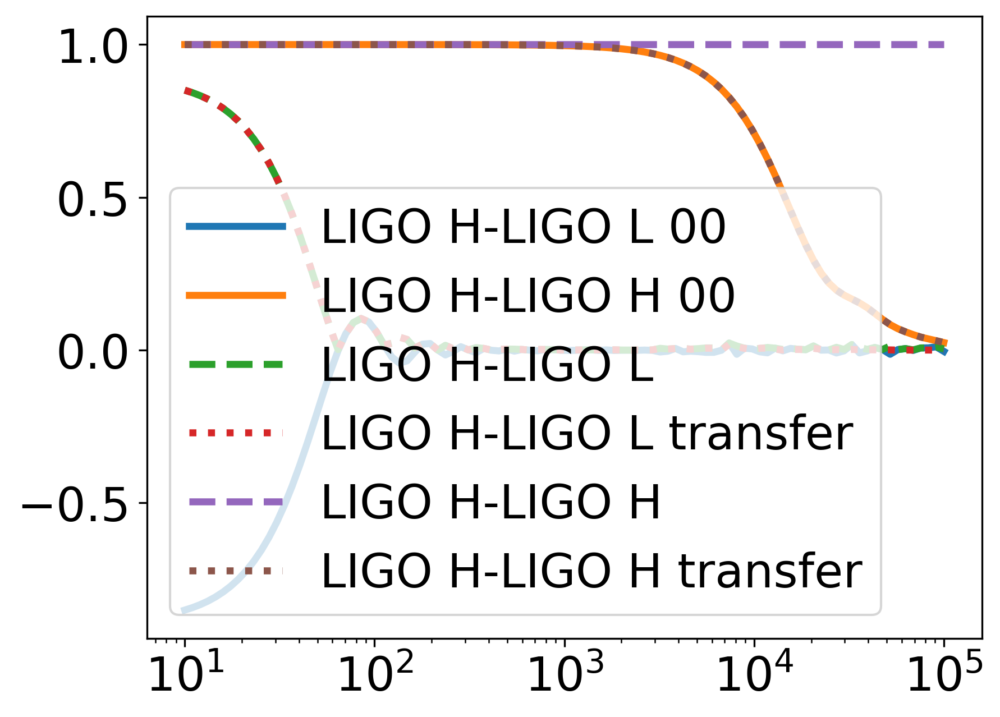

In [11]:
plt.semilogx(f, np.real(R00_LIGO), label='LIGO H-LIGO L 00')
plt.semilogx(f, np.real(R00_LIGO_auto), label='LIGO H-LIGO H 00')
plt.semilogx(f, R0_LIGO, linestyle='dashed', label='LIGO H-LIGO L')
plt.semilogx(f, R0_LIGO_transfer, linestyle='dotted',   label='LIGO H-LIGO L transfer')
plt.semilogx(f, R_0_LIGO_auto, linestyle='dashed', label='LIGO H-LIGO H')
plt.semilogx(f, R_0_LIGO_auto_transfer, linestyle='dotted', label='LIGO H-LIGO H transfer')
plt.legend()
plt.show()

Tensor, Vector, Scalar for $\ell = 0, 1, 2, 3$

In [12]:
f = np.logspace(1, 3, 100)

In [13]:
import pickle
from tqdm.notebook import tqdm, trange

LIGO_Rell = {0:{},
            1:{},
            2:{},
            3:{}}


for ell in tqdm(LIGO_Rell.keys()):
    for pol in ['t', 'v', 's']:
        LIGO_Rell[ell][pol] = R_ell_transfer(ell, ecH, e1H, e2H, ecL, e1L, e2L, c, f, pol, l)
        # with open(f'LIGO_Rell_{ell}_{pol}.pkl', 'wb') as f:
        #     pickle.dump(LIGO_Rell[ell][pol], f)

with open('LIGO_Rell.pkl', 'wb') as f:
    pickle.dump(LIGO_Rell, f)


  0%|          | 0/4 [00:00<?, ?it/s]

In [83]:
with open('LIGO_Rell.pkl', 'rb') as f:
    LIGO_Rell = pickle.load(f)



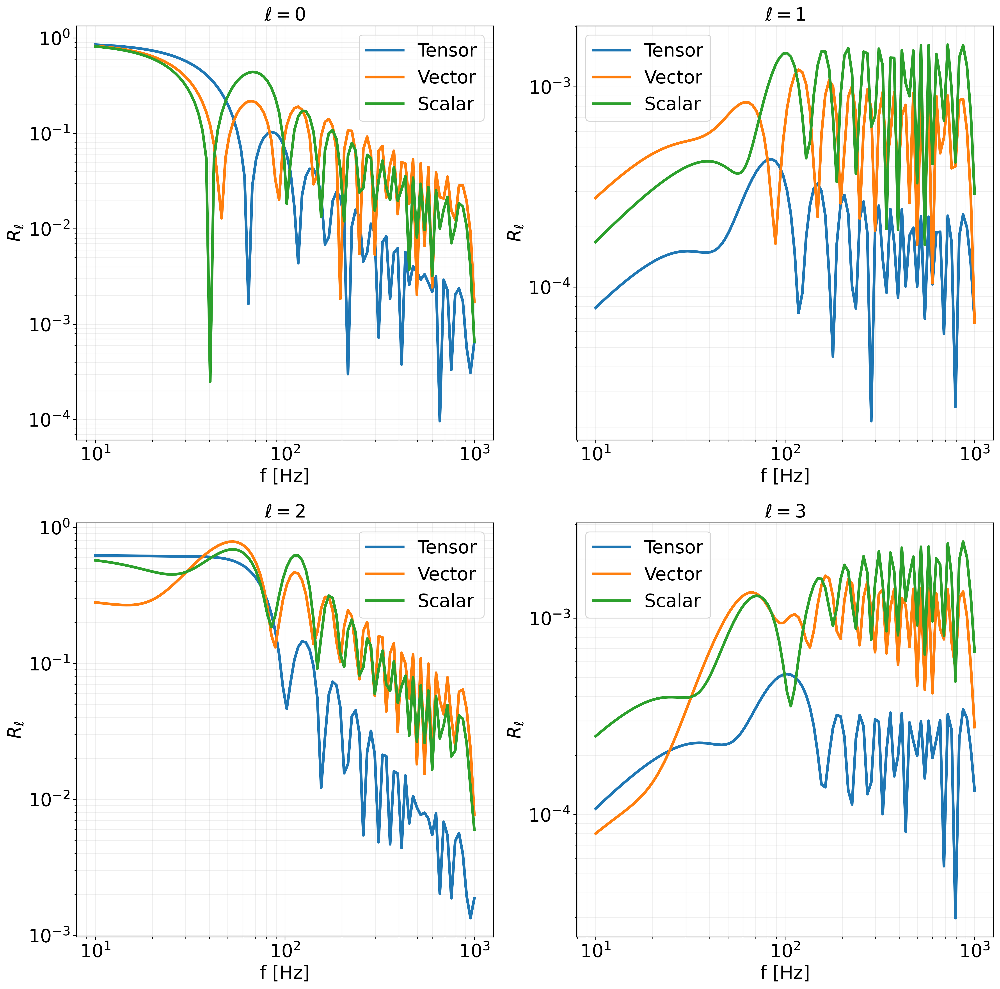

In [14]:
# create a 2x2 plot 
fig, axs = plt.subplots(2, 2, figsize=(18, 18))
f =  np.logspace(1, 3, 100)

axs[0, 0].loglog(f, [float(val) for val in list(LIGO_Rell[0]['t'])], label='Tensor')
axs[0, 0].loglog(f, [float(val) for val in list(LIGO_Rell[0]['v'])], label='Vector')
axs[0, 0].loglog(f, [float(val) for val in list(LIGO_Rell[0]['s'])], label='Scalar')
axs[0, 0].set_title(r'$\ell=0$')
axs[0, 0].legend()
axs[0, 0].set_xlabel('f [Hz]')
axs[0, 0].set_ylabel(r'$R_{\ell}$')
axs[0,0].grid(True, which='both', alpha=0.2)

axs[0, 1].loglog(f, [float(val) for val in list(LIGO_Rell[1]['t'])], label='Tensor')
axs[0, 1].loglog(f, [float(val) for val in list(LIGO_Rell[1]['v'])], label='Vector')
axs[0, 1].loglog(f, [float(val) for val in list(LIGO_Rell[1]['s'])], label='Scalar')
axs[0, 1].set_title(r'$\ell=1$')
axs[0, 1].legend()
axs[0, 1].set_xlabel('f [Hz]')
axs[0, 1].set_ylabel(r'$R_{\ell}$')
axs[0,1].grid(True, which='both', alpha=0.2)

axs[1, 0].loglog(f, [float(val) for val in list(LIGO_Rell[2]['t'])], label='Tensor')
axs[1, 0].loglog(f, [float(val) for val in list(LIGO_Rell[2]['v'])], label='Vector')
axs[1, 0].loglog(f, [float(val) for val in list(LIGO_Rell[2]['s'])], label='Scalar')
axs[1, 0].set_title(r'$\ell=2$')
axs[1, 0].legend()
axs[1, 0].set_xlabel('f [Hz]')
axs[1, 0].set_ylabel(r'$R_{\ell}$')
axs[1,0].grid(True, which='both', alpha=0.2)

axs[1, 1].loglog(f, [float(val) for val in list(LIGO_Rell[3]['t'])], label='Tensor')
axs[1, 1].loglog(f, [float(val) for val in list(LIGO_Rell[3]['v'])], label='Vector')
axs[1, 1].loglog(f, [float(val) for val in list(LIGO_Rell[3]['s'])], label='Scalar')
axs[1, 1].set_title(r'$\ell=3$')
axs[1, 1].legend()
axs[1, 1].set_xlabel('f [Hz]')
axs[1, 1].set_ylabel(r'$R_{\ell}$')
axs[1,1].grid(True, which='both', alpha=0.2)




Sensitivity to l multipoles

In [85]:
# Bartolo et al. 2022 eq.4.42

# Bartolo et al. 2022 eq.4.42

def Omega_l(det1, det2, Rl, f):

    fi, PnI = det.detector_Pn(det1)
    fj, PnJ = det.detector_Pn(det2)
    Nl = 4 * np.pi**2 * np.sqrt(4*np.pi) / (3* H0**2) * fi**3 * np.sqrt(PnI * PnJ) 

    Nl = np.interp(f, fi, Nl)

    return Nl/Rl/np.sqrt(4* np.pi)*0.49


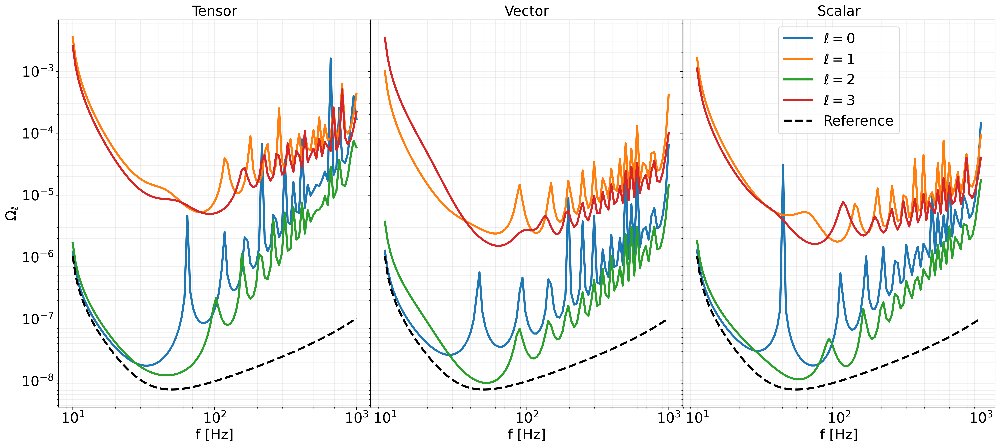

In [86]:
N0_LIGO_t = Omega_l('LIGO H', 'LIGO L', LIGO_Rell[0]['t'], f)
N1_LIGO_t = Omega_l('LIGO H', 'LIGO L', LIGO_Rell[1]['t'], f)
N2_LIGO_t = Omega_l('LIGO H', 'LIGO L', LIGO_Rell[2]['t'], f)
N3_LIGO_t = Omega_l('LIGO H', 'LIGO L', LIGO_Rell[3]['t'], f)

N0_LIGO_v = Omega_l('LIGO H', 'LIGO L', LIGO_Rell[0]['v'], f)
N1_LIGO_v = Omega_l('LIGO H', 'LIGO L', LIGO_Rell[1]['v'], f)
N2_LIGO_v = Omega_l('LIGO H', 'LIGO L', LIGO_Rell[2]['v'], f)
N3_LIGO_v = Omega_l('LIGO H', 'LIGO L', LIGO_Rell[3]['v'], f)

N0_LIGO_s = Omega_l('LIGO H', 'LIGO L', LIGO_Rell[0]['s'], f)
N1_LIGO_s = Omega_l('LIGO H', 'LIGO L', LIGO_Rell[1]['s'], f)
N2_LIGO_s = Omega_l('LIGO H', 'LIGO L', LIGO_Rell[2]['s'], f)
N3_LIGO_s = Omega_l('LIGO H', 'LIGO L', LIGO_Rell[3]['s'], f)

ref = Omega_l('LIGO H', 'LIGO L', np.ones(len(f)), f) # if the overlap was identically 1   



# make three plots for each polarization

fig, axs = plt.subplots(1, 3, figsize=(24, 10), sharey=True)

plt.subplots_adjust(wspace=0, hspace=0)

axs[0].loglog(f, N0_LIGO_t, label=r'$\ell=0$')
axs[0].loglog(f, N1_LIGO_t, label=r'$\ell=1$')
axs[0].loglog(f, N2_LIGO_t, label=r'$\ell=2$')
axs[0].loglog(f, N3_LIGO_t, label=r'$\ell=3$')
axs[0].loglog(f, ref, linestyle='dashed', label='Reference', color='black')
#axs[0].legend()
axs[0].set_xlabel('f [Hz]')
axs[0].set_ylabel(r'$\Omega_{\ell}$')
axs[0].set_title('Tensor')
axs[0].grid(True, which='both', alpha=0.2)

axs[1].loglog(f, N0_LIGO_v, label=r'$\ell=0$')
axs[1].loglog(f, N1_LIGO_v, label=r'$\ell=1$')
axs[1].loglog(f, N2_LIGO_v, label=r'$\ell=2$')
axs[1].loglog(f, N3_LIGO_v, label=r'$\ell=3$')
axs[1].loglog(f, ref, linestyle='dashed', label='Reference', color='black')
#axs[1].legend()
axs[1].set_xlabel('f [Hz]')
axs[1].set_title('Vector')
axs[1].grid(True, which='both', alpha=0.2)

axs[2].loglog(f, N0_LIGO_s, label=r'$\ell=0$')
axs[2].loglog(f, N1_LIGO_s, label=r'$\ell=1$')
axs[2].loglog(f, N2_LIGO_s, label=r'$\ell=2$')
axs[2].loglog(f, N3_LIGO_s, label=r'$\ell=3$')
axs[2].loglog(f, ref, linestyle='dashed', label='Reference', color='black')
axs[2].legend()
axs[2].set_xlabel('f [Hz]')
axs[2].set_title('Scalar')
axs[2].grid(True, which='both', alpha=0.2)



# ET Triangular

In [125]:
ecET1, e1ET1, e2ET1, l, name = det.detector('ET A', shift_angle=None)
ecET2, e1ET2, e2ET2, l, name = det.detector('ET B', shift_angle=None)

f = np.logspace(0, 4, 100) 

R0_ET_auto = R_ell(0, ecET1, e1ET1, e2ET1, ecET1, e1ET1, e2ET1, c, f, 't')
R0_ET_auto_transfer = R_ell_transfer(0, ecET1, e1ET1, e2ET1, ecET1, e1ET1, e2ET1, c, f, 't', l)

R0_ET_cross = R_ell(0, ecET1, e1ET1, e2ET1, ecET2, e1ET2, e2ET2, c, f, 't')
R0_ET_cross_transfer = R_ell_transfer(0, ecET1, e1ET1, e2ET1, ecET2, e1ET2, e2ET2, c, f, 't', l)


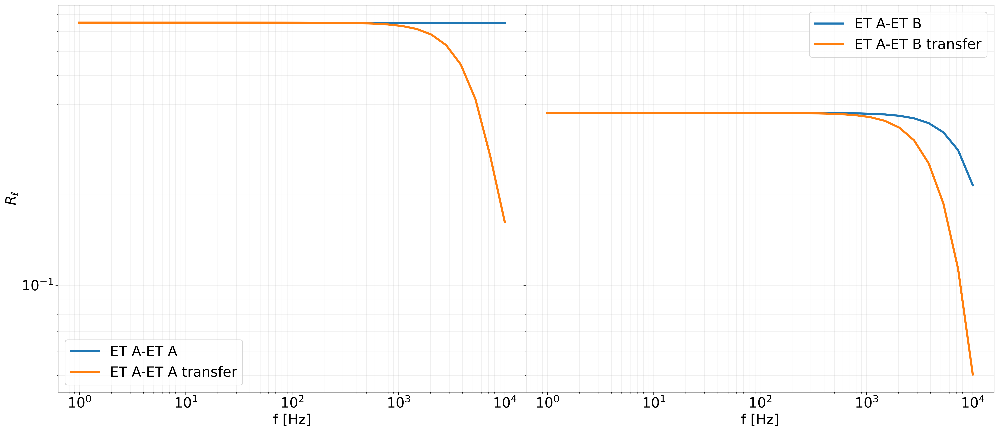

In [38]:
fig, axs = plt.subplots(1, 2, figsize=(24, 10), sharey=True)

plt.subplots_adjust(wspace=0, hspace=0)

axs[0].loglog(f, R0_ET_auto, label='ET A-ET A')
axs[0].loglog(f, R0_ET_auto_transfer, label='ET A-ET A transfer')

axs[0].legend()
axs[0].set_xlabel('f [Hz]')
axs[0].set_ylabel(r'$R_{\ell}$')
axs[0].grid(True, which='both', alpha=0.2)

axs[1].loglog(f, R0_ET_cross, label='ET A-ET B')
axs[1].loglog(f, R0_ET_cross_transfer, label='ET A-ET B transfer')
axs[1].legend()
axs[1].set_xlabel('f [Hz]')
axs[1].grid(True, which='both', alpha=0.2)

plt.show()


This clearly show that the transfer function needs to be taken into account. 

Note: the code for the trasfer function does not put the 5/2 term because in LISA things are normalized differently, however remember to add this extra factor here. Maybe in the wrapper it can be taken into account.

In [126]:
ETtr_Rell = {0:{},
            1:{},
            2:{},
            3:{}}


for ell in tqdm(ETtr_Rell.keys()):
    for pol in ['t', 'v', 's']:
        ETtr_Rell[ell][pol] = R_ell_transfer(ell, ecET1, e1ET1, e2ET1, ecET2, e1ET2, e2ET2, c, f, pol, l)




  0%|          | 0/4 [00:00<?, ?it/s]

In [127]:
with open('ETtr_Rell.pkl', 'wb') as f:
    pickle.dump(ETtr_Rell, f)

In [128]:
with open('ETtr_Rell.pkl', 'rb') as f:
    ETtr_Rell = pickle.load(f)

Text(0, 0.5, '$R_{\\ell}$')

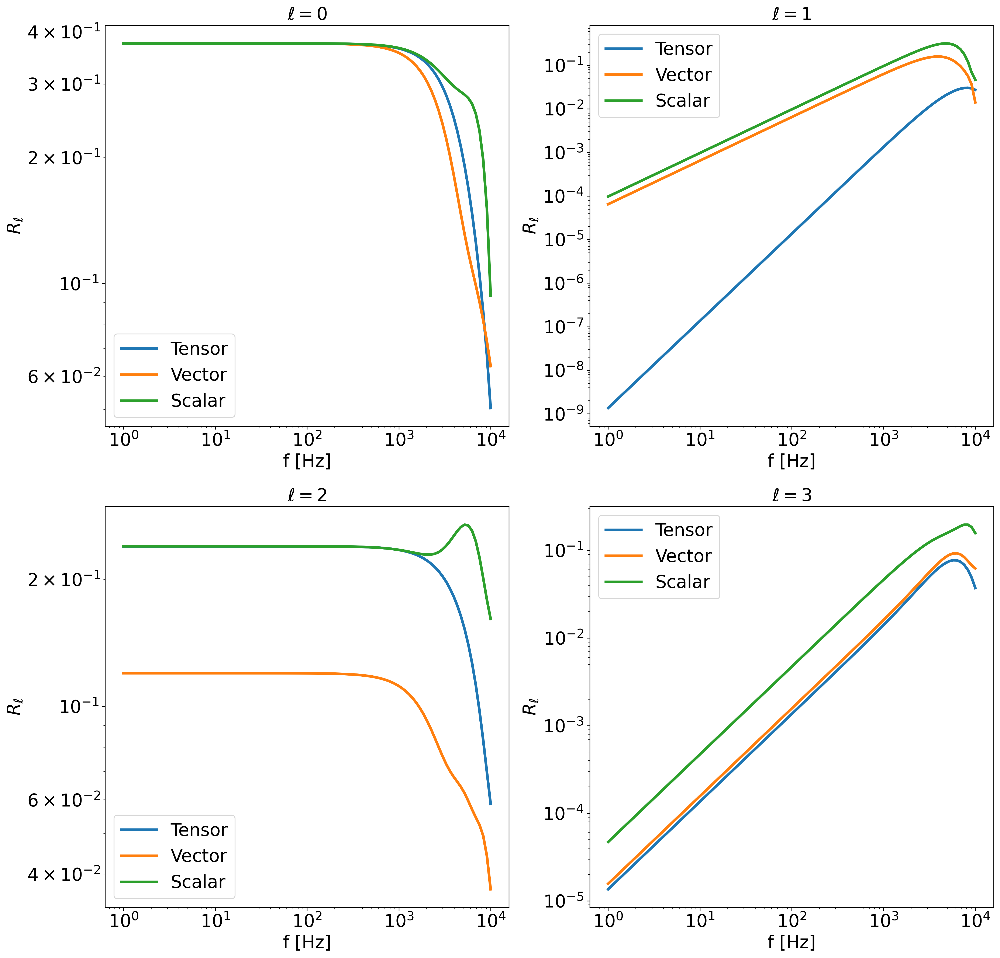

In [129]:
# create a 2x2 plot 
fig, axs = plt.subplots(2, 2, figsize=(18, 18))

f = np.logspace(0, 4, 100) 

axs[0, 0].loglog(f, ETtr_Rell[0]['t'], label='Tensor')
axs[0, 0].loglog(f, ETtr_Rell[0]['v'], label='Vector')
axs[0, 0].loglog(f, ETtr_Rell[0]['s'], label='Scalar')
axs[0, 0].set_title(r'$\ell=0$')
axs[0, 0].legend()
axs[0, 0].set_xlabel('f [Hz]')
axs[0, 0].set_ylabel(r'$R_{\ell}$')

axs[0, 1].loglog(f, ETtr_Rell[1]['t'], label='Tensor')
axs[0, 1].loglog(f, ETtr_Rell[1]['v'], label='Vector')
axs[0, 1].loglog(f, ETtr_Rell[1]['s'], label='Scalar')
axs[0, 1].set_title(r'$\ell=1$')
axs[0, 1].legend()
axs[0, 1].set_xlabel('f [Hz]')
axs[0, 1].set_ylabel(r'$R_{\ell}$')

axs[1, 0].loglog(f, ETtr_Rell[2]['t'], label='Tensor')
axs[1, 0].loglog(f, ETtr_Rell[2]['v'], label='Vector')
axs[1, 0].loglog(f, ETtr_Rell[2]['s'], label='Scalar')
axs[1, 0].set_title(r'$\ell=2$')
axs[1, 0].legend()
axs[1, 0].set_xlabel('f [Hz]')
axs[1, 0].set_ylabel(r'$R_{\ell}$')

axs[1, 1].loglog(f, ETtr_Rell[3]['t'], label='Tensor')
axs[1, 1].loglog(f, ETtr_Rell[3]['v'], label='Vector')
axs[1, 1].loglog(f, ETtr_Rell[3]['s'], label='Scalar')
axs[1, 1].set_title(r'$\ell=3$')
axs[1, 1].legend()
axs[1, 1].set_xlabel('f [Hz]')
axs[1, 1].set_ylabel(r'$R_{\ell}$')

In [130]:
# Bartolo et al. 2022 eq.4.42

def Omega_l(det1, det2, Rl, f):

    fi, PnI = det.detector_Pn(det1)
    fj, PnJ = det.detector_Pn(det2)
    Nl = 10 * np.pi**2 * np.sqrt(4*np.pi) / (3* H0**2) * fi*3 * np.sqrt(PnI * PnJ) 

    Nl = np.interp(f, fi, Nl)

    return Nl/Rl#/np.sqrt(4* np.pi)*0.49


In [131]:
N0_ET_t = Omega_l('ET A', 'ET B', ETtr_Rell[0]['t'], f)
N1_ET_t = Omega_l('ET A', 'ET B', ETtr_Rell[1]['t'], f)
N2_ET_t = Omega_l('ET A', 'ET B', ETtr_Rell[2]['t'], f)
N3_ET_t = Omega_l('ET A', 'ET B', ETtr_Rell[3]['t'], f)

N0_ET_v = Omega_l('ET A', 'ET B', ETtr_Rell[0]['v'], f)
N1_ET_v = Omega_l('ET A', 'ET B', ETtr_Rell[1]['v'], f)
N2_ET_v = Omega_l('ET A', 'ET B', ETtr_Rell[2]['v'], f)
N3_ET_v = Omega_l('ET A', 'ET B', ETtr_Rell[3]['v'], f)

N0_ET_s = Omega_l('ET A', 'ET B', ETtr_Rell[0]['s'], f)
N1_ET_s = Omega_l('ET A', 'ET B', ETtr_Rell[1]['s'], f)
N2_ET_s = Omega_l('ET A', 'ET B', ETtr_Rell[2]['s'], f)
N3_ET_s = Omega_l('ET A', 'ET B', ETtr_Rell[3]['s'], f)

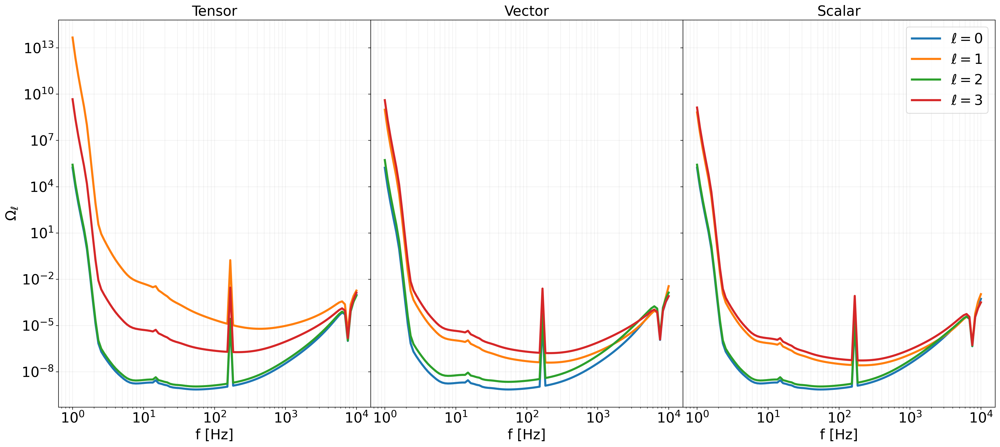

In [132]:
fig, axs = plt.subplots(1, 3, figsize=(24, 10), sharey=True)

plt.subplots_adjust(wspace=0, hspace=0)


axs[0].loglog(f, N0_ET_t, label=r'$\ell=0$')
axs[0].loglog(f, N1_ET_t, label=r'$\ell=1$')
axs[0].loglog(f, N2_ET_t, label=r'$\ell=2$')
axs[0].loglog(f, N3_ET_t, label=r'$\ell=3$')
#axs[0].legend()
axs[0].set_xlabel('f [Hz]')
axs[0].set_ylabel(r'$\Omega_{\ell}$')
axs[0].set_title('Tensor')
axs[0].grid(True, which='both', alpha=0.2)

axs[1].loglog(f, N0_ET_v, label=r'$\ell=0$')
axs[1].loglog(f, N1_ET_v, label=r'$\ell=1$')
axs[1].loglog(f, N2_ET_v, label=r'$\ell=2$')
axs[1].loglog(f, N3_ET_v, label=r'$\ell=3$')
#axs[1].legend()
axs[1].set_xlabel('f [Hz]')
axs[1].set_title('Vector')
axs[1].grid(True, which='both', alpha=0.2)

axs[2].loglog(f, N0_ET_s, label=r'$\ell=0$')
axs[2].loglog(f, N1_ET_s, label=r'$\ell=1$')
axs[2].loglog(f, N2_ET_s, label=r'$\ell=2$')
axs[2].loglog(f, N3_ET_s, label=r'$\ell=3$')
axs[2].legend()
axs[2].set_xlabel('f [Hz]')
axs[2].set_title('Scalar')
axs[2].grid(True, which='both', alpha=0.2)

# ET -2L configuration $\alpha = 0 $

In [67]:
ecET1, e1ET1, e2ET1, l, name = det.detector('ET L1', shift_angle=None)
ecET2, e1ET2, e2ET2, l, name = det.detector('ET L2', shift_angle=0)

f = np.logspace(0,4, 100) 

R0_ET_auto = R_ell(0, ecET1, e1ET1, e2ET1, ecET1, e1ET1, e2ET1, c, f, 't')
R0_ET_auto_transfer = R_ell_transfer(0, ecET1, e1ET1, e2ET1, ecET1, e1ET1, e2ET1, c, f, 't', l)

R0_ET_cross = R_ell(0, ecET1, e1ET1, e2ET1, ecET2, e1ET2, e2ET2, c, f, 't')
R0_ET_cross_transfer = R_ell_transfer(0, ecET1, e1ET1, e2ET1, ecET2, e1ET2, e2ET2, c, f, 't', l)

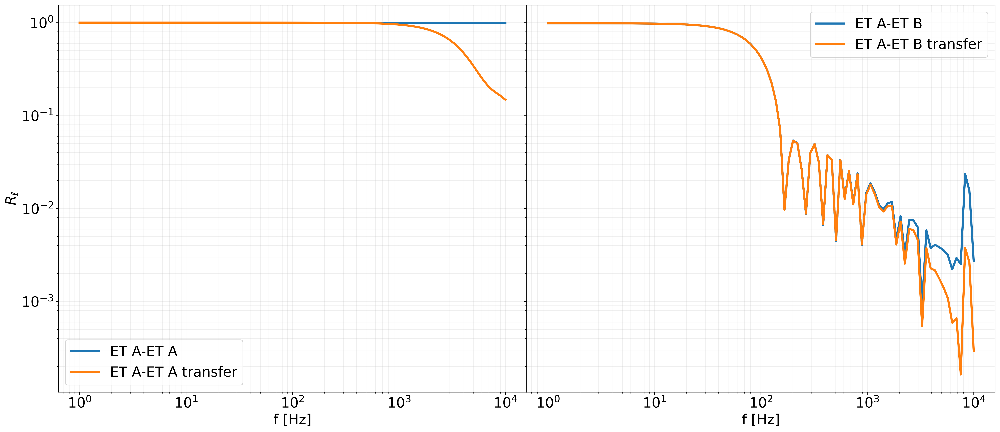

In [69]:
fig, axs = plt.subplots(1, 2, figsize=(24, 10), sharey=True)

plt.subplots_adjust(wspace=0, hspace=0)

axs[0].loglog(f, R0_ET_auto, label='ET A-ET A')
axs[0].loglog(f, R0_ET_auto_transfer, label='ET A-ET A transfer')

axs[0].legend()
axs[0].set_xlabel('f [Hz]')
axs[0].set_ylabel(r'$R_{\ell}$')
axs[0].grid(True, which='both', alpha=0.2)

axs[1].loglog(f, R0_ET_cross, label='ET A-ET B')
axs[1].loglog(f, R0_ET_cross_transfer, label='ET A-ET B transfer')
axs[1].legend()
axs[1].set_xlabel('f [Hz]')
axs[1].grid(True, which='both', alpha=0.2)

plt.show()

In [70]:
R0_ET_t = R_ell_transfer(0, ecET1, e1ET1, e2ET1, ecET2, e1ET2, e2ET2, c, f, 't', l)
R1_ET_t = R_ell_transfer(1, ecET1, e1ET1, e2ET1, ecET2, e1ET2, e2ET2, c, f, 't', l)
R2_ET_t = R_ell_transfer(2, ecET1, e1ET1, e2ET1, ecET2, e1ET2, e2ET2, c, f, 't', l)
R3_ET_t = R_ell_transfer(3, ecET1, e1ET1, e2ET1, ecET2, e1ET2, e2ET2, c, f, 't', l)

R0_ET_v = R_ell_transfer(0, ecET1, e1ET1, e2ET1, ecET2, e1ET2, e2ET2, c, f, 'v', l)
R1_ET_v = R_ell_transfer(1, ecET1, e1ET1, e2ET1, ecET2, e1ET2, e2ET2, c, f, 'v', l)
R2_ET_v = R_ell_transfer(2, ecET1, e1ET1, e2ET1, ecET2, e1ET2, e2ET2, c, f, 'v', l)
R3_ET_v = R_ell_transfer(3, ecET1, e1ET1, e2ET1, ecET2, e1ET2, e2ET2, c, f, 'v', l)

R0_ET_s = R_ell_transfer(0, ecET1, e1ET1, e2ET1, ecET2, e1ET2, e2ET2, c, f, 's', l)
R1_ET_s = R_ell_transfer(1, ecET1, e1ET1, e2ET1, ecET2, e1ET2, e2ET2, c, f, 's', l)
R2_ET_s = R_ell_transfer(2, ecET1, e1ET1, e2ET1, ecET2, e1ET2, e2ET2, c, f, 's', l)
R3_ET_s = R_ell_transfer(3, ecET1, e1ET1, e2ET1, ecET2, e1ET2, e2ET2, c, f, 's', l)

In [77]:
ET2L0_Rell = {0:{},
            1:{},
            2:{},
            3:{}}


for ell in tqdm(ET2L0_Rell.keys()):
    for pol in ['t', 'v', 's']:
        ET2L0_Rell[ell][pol] = R_ell_transfer(ell, ecET1, e1ET1, e2ET1, ecET2, e1ET2, e2ET2, c, f, pol, l)

with open('ET2L0_Rell.pkl', 'wb') as f:
    pickle.dump(ET2L0_Rell, f)


  0%|          | 0/4 [00:00<?, ?it/s]

Text(0, 0.5, '$R_{\\ell}$')

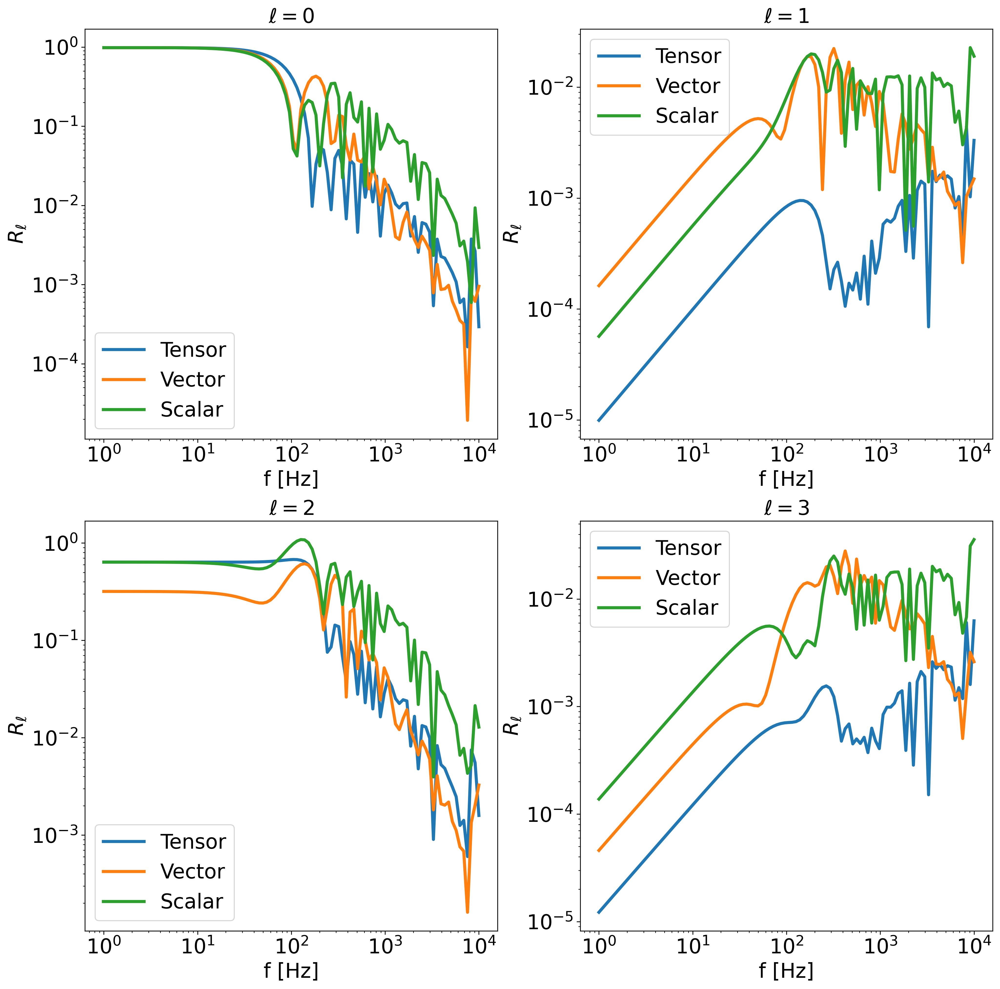

In [79]:
fig, axs = plt.subplots(2, 2, figsize=(16, 16))

f = np.logspace(0, 4, 100)

axs[0, 0].loglog(f, ET2L0_Rell[0]['t'], label='Tensor')
axs[0, 0].loglog(f, ET2L0_Rell[0]['v'], label='Vector')
axs[0, 0].loglog(f, ET2L0_Rell[0]['s'], label='Scalar')
axs[0, 0].set_title(r'$\ell=0$')
axs[0, 0].legend()
axs[0, 0].set_xlabel('f [Hz]')
axs[0, 0].set_ylabel(r'$R_{\ell}$')

axs[0, 1].loglog(f, ET2L0_Rell[1]['t'], label='Tensor')
axs[0, 1].loglog(f, ET2L0_Rell[1]['v'], label='Vector')
axs[0, 1].loglog(f, ET2L0_Rell[1]['s'], label='Scalar')
axs[0, 1].set_title(r'$\ell=1$')
axs[0, 1].legend()
axs[0, 1].set_xlabel('f [Hz]')
axs[0, 1].set_ylabel(r'$R_{\ell}$')

axs[1, 0].loglog(f, ET2L0_Rell[2]['t'], label='Tensor')
axs[1, 0].loglog(f, ET2L0_Rell[2]['v'], label='Vector')
axs[1, 0].loglog(f, ET2L0_Rell[2]['s'], label='Scalar')
axs[1, 0].set_title(r'$\ell=2$')
axs[1, 0].legend()
axs[1, 0].set_xlabel('f [Hz]')
axs[1, 0].set_ylabel(r'$R_{\ell}$')

axs[1, 1].loglog(f, ET2L0_Rell[3]['t'], label='Tensor')
axs[1, 1].loglog(f, ET2L0_Rell[3]['v'], label='Vector')
axs[1, 1].loglog(f, ET2L0_Rell[3]['s'], label='Scalar')
axs[1, 1].set_title(r'$\ell=3$')
axs[1, 1].legend()
axs[1, 1].set_xlabel('f [Hz]')
axs[1, 1].set_ylabel(r'$R_{\ell}$')

In [224]:
N0_ET_t = Omega_l('ET A', 'ET B', R0_ET_t, f)
N1_ET_t = Omega_l('ET A', 'ET B', R1_ET_t, f)
N2_ET_t = Omega_l('ET A', 'ET B', R2_ET_t, f)
N3_ET_t = Omega_l('ET A', 'ET B', R3_ET_t, f)

N0_ET_v = Omega_l('ET A', 'ET B', R0_ET_v, f)
N1_ET_v = Omega_l('ET A', 'ET B', R1_ET_v, f)
N2_ET_v = Omega_l('ET A', 'ET B', R2_ET_v, f)
N3_ET_v = Omega_l('ET A', 'ET B', R3_ET_v, f)

N0_ET_s = Omega_l('ET A', 'ET B', R0_ET_s, f)
N1_ET_s = Omega_l('ET A', 'ET B', R1_ET_s, f)
N2_ET_s = Omega_l('ET A', 'ET B', R2_ET_s, f)
N3_ET_s = Omega_l('ET A', 'ET B', R3_ET_s, f)

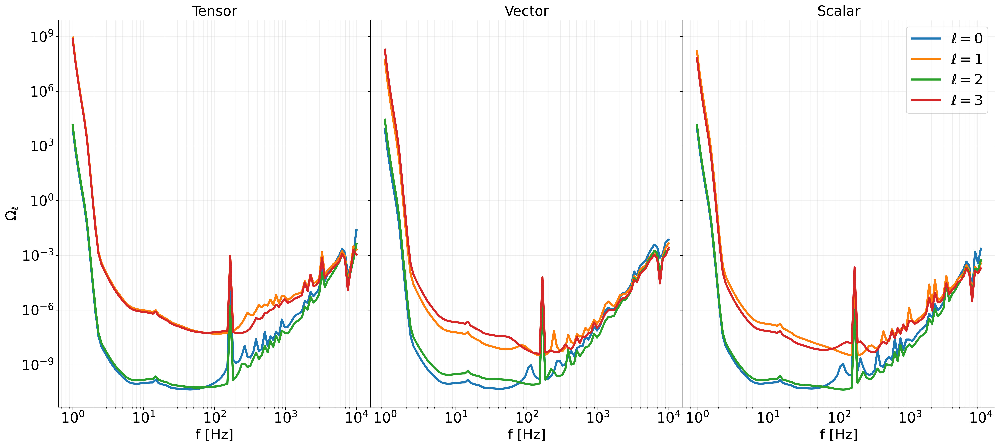

In [225]:
fig, axs = plt.subplots(1, 3, figsize=(24, 10), sharey=True)

plt.subplots_adjust(wspace=0, hspace=0)

axs[0].loglog(f, N0_ET_t, label=r'$\ell=0$')
axs[0].loglog(f, N1_ET_t, label=r'$\ell=1$')
axs[0].loglog(f, N2_ET_t, label=r'$\ell=2$')
axs[0].loglog(f, N3_ET_t, label=r'$\ell=3$')
#axs[0].legend()
axs[0].set_xlabel('f [Hz]')
axs[0].set_ylabel(r'$\Omega_{\ell}$')
axs[0].set_title('Tensor')
axs[0].grid(True, which='both', alpha=0.2)

axs[1].loglog(f, N0_ET_v, label=r'$\ell=0$')
axs[1].loglog(f, N1_ET_v, label=r'$\ell=1$')
axs[1].loglog(f, N2_ET_v, label=r'$\ell=2$')
axs[1].loglog(f, N3_ET_v, label=r'$\ell=3$')
#axs[1].legend()
axs[1].set_xlabel('f [Hz]')
axs[1].set_title('Vector')
axs[1].grid(True, which='both', alpha=0.2)

axs[2].loglog(f, N0_ET_s, label=r'$\ell=0$')
axs[2].loglog(f, N1_ET_s, label=r'$\ell=1$')
axs[2].loglog(f, N2_ET_s, label=r'$\ell=2$')
axs[2].loglog(f, N3_ET_s, label=r'$\ell=3$')
axs[2].legend()
axs[2].set_xlabel('f [Hz]')
axs[2].set_title('Scalar')
axs[2].grid(True, which='both', alpha=0.2)

# ET - 2L configuration $\alpha = 45$ deg (worst case scenario)

In [94]:
ecET1, e1ET1, e2ET1, l, name = det.detector('ET L1', shift_angle=None)
ecET2, e1ET2, e2ET2, l, name = det.detector('ET L2', shift_angle=np.deg2rad(45))

f = np.logspace(0,4, 100) 

R0_ET_auto = R_ell(0, ecET1, e1ET1, e2ET1, ecET1, e1ET1, e2ET1, c, f, 't')
R0_ET_auto_transfer = R_ell_transfer(0, ecET1, e1ET1, e2ET1, ecET1, e1ET1, e2ET1, c, f, 't', l)

R0_ET_cross = R_ell(0, ecET1, e1ET1, e2ET1, ecET2, e1ET2, e2ET2, c, f, 't')
R0_ET_cross_transfer = R_ell_transfer(0, ecET1, e1ET1, e2ET1, ecET2, e1ET2, e2ET2, c, f, 't', l)

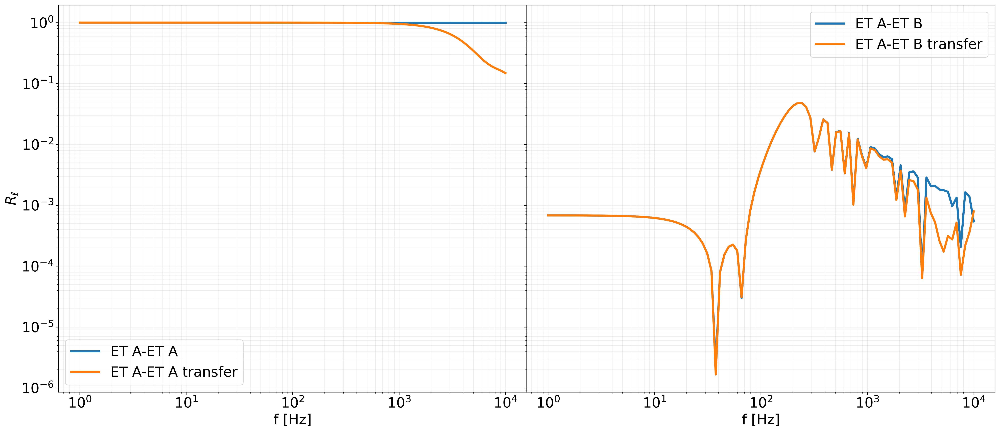

In [228]:
fig, axs = plt.subplots(1, 2, figsize=(24, 10), sharey=True)

plt.subplots_adjust(wspace=0, hspace=0)

axs[0].loglog(f, R0_ET_auto, label='ET A-ET A')
axs[0].loglog(f, 5/2*R0_ET_auto_transfer, label='ET A-ET A transfer')

axs[0].legend()
axs[0].set_xlabel('f [Hz]')
axs[0].set_ylabel(r'$R_{\ell}$')
axs[0].grid(True, which='both', alpha=0.2)

axs[1].loglog(f, R0_ET_cross, label='ET A-ET B')
axs[1].loglog(f, 5/2*R0_ET_cross_transfer, label='ET A-ET B transfer')
axs[1].legend()
axs[1].set_xlabel('f [Hz]')
axs[1].grid(True, which='both', alpha=0.2)

plt.show()

In [229]:
R0_ET_t = R_ell_transfer(0, ecET1, e1ET1, e2ET1, ecET2, e1ET2, e2ET2, c, f, 't', l)
R1_ET_t = R_ell_transfer(1, ecET1, e1ET1, e2ET1, ecET2, e1ET2, e2ET2, c, f, 't', l)
R2_ET_t = R_ell_transfer(2, ecET1, e1ET1, e2ET1, ecET2, e1ET2, e2ET2, c, f, 't', l)
R3_ET_t = R_ell_transfer(3, ecET1, e1ET1, e2ET1, ecET2, e1ET2, e2ET2, c, f, 't', l)

R0_ET_v = R_ell_transfer(0, ecET1, e1ET1, e2ET1, ecET2, e1ET2, e2ET2, c, f, 'v', l)
R1_ET_v = R_ell_transfer(1, ecET1, e1ET1, e2ET1, ecET2, e1ET2, e2ET2, c, f, 'v', l)
R2_ET_v = R_ell_transfer(2, ecET1, e1ET1, e2ET1, ecET2, e1ET2, e2ET2, c, f, 'v', l)
R3_ET_v = R_ell_transfer(3, ecET1, e1ET1, e2ET1, ecET2, e1ET2, e2ET2, c, f, 'v', l)

R0_ET_s = R_ell_transfer(0, ecET1, e1ET1, e2ET1, ecET2, e1ET2, e2ET2, c, f, 's', l)
R1_ET_s = R_ell_transfer(1, ecET1, e1ET1, e2ET1, ecET2, e1ET2, e2ET2, c, f, 's', l)
R2_ET_s = R_ell_transfer(2, ecET1, e1ET1, e2ET1, ecET2, e1ET2, e2ET2, c, f, 's', l)
R3_ET_s = R_ell_transfer(3, ecET1, e1ET1, e2ET1, ecET2, e1ET2, e2ET2, c, f, 's', l)

(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)
(100, 100, 100)


In [95]:
ET2L45_Rell = {0:{},
            1:{},
            2:{},
            3:{}}


for ell in tqdm(ET2L45_Rell.keys()):
    for pol in ['t', 'v', 's']:
        ET2L45_Rell[ell][pol] = R_ell_transfer(ell, ecET1, e1ET1, e2ET1, ecET2, e1ET2, e2ET2, c, f, pol, l)

with open('ET2L45_Rell.pkl', 'wb') as f:
    pickle.dump(ET2L45_Rell, f)

  0%|          | 0/4 [00:00<?, ?it/s]

Text(0, 0.5, '$R_{\\ell}$')

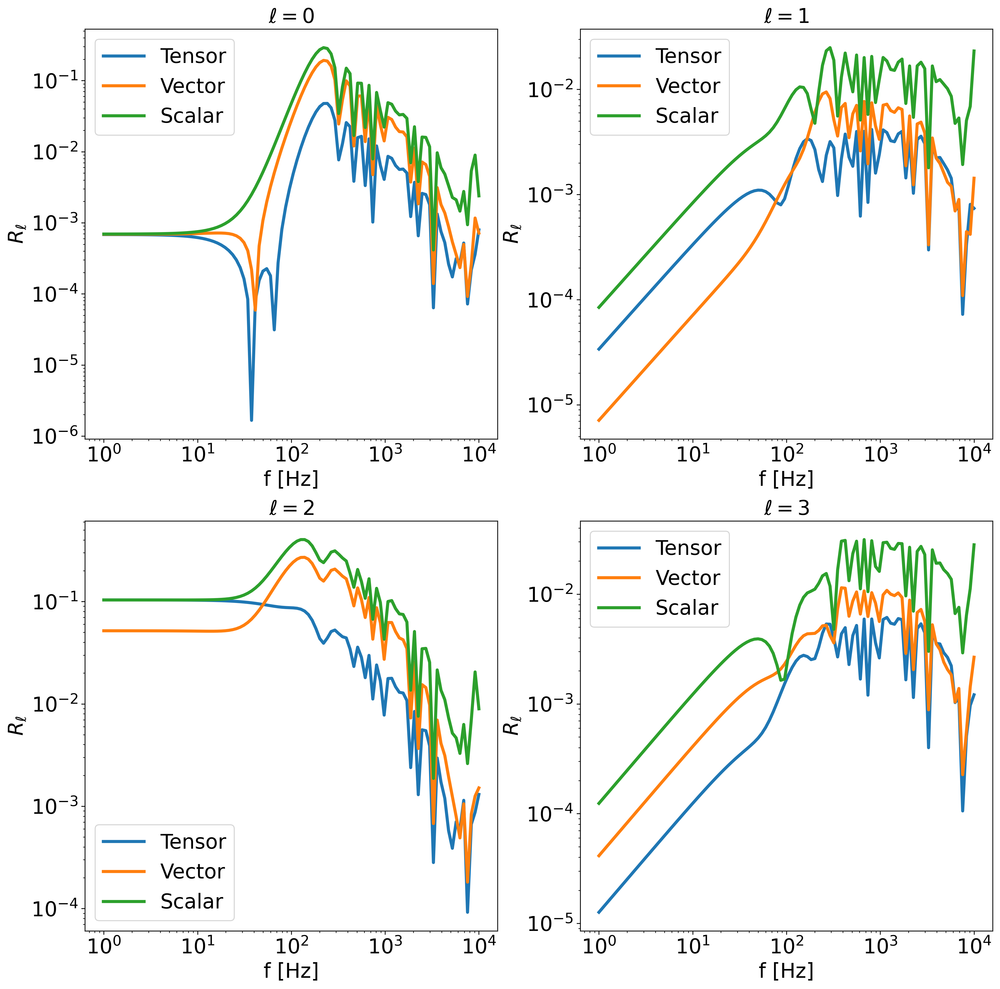

In [96]:
fig, axs = plt.subplots(2, 2, figsize=(16, 16))

f = np.logspace(0, 4, 100)

axs[0, 0].loglog(f, ET2L45_Rell[0]['t'], label='Tensor')
axs[0, 0].loglog(f, ET2L45_Rell[0]['v'], label='Vector')
axs[0, 0].loglog(f, ET2L45_Rell[0]['s'], label='Scalar')
axs[0, 0].set_title(r'$\ell=0$')
axs[0, 0].legend()
axs[0, 0].set_xlabel('f [Hz]')
axs[0, 0].set_ylabel(r'$R_{\ell}$')

axs[0, 1].loglog(f, ET2L45_Rell[1]['t'], label='Tensor')
axs[0, 1].loglog(f, ET2L45_Rell[1]['v'], label='Vector')
axs[0, 1].loglog(f, ET2L45_Rell[1]['s'], label='Scalar')
axs[0, 1].set_title(r'$\ell=1$')
axs[0, 1].legend()
axs[0, 1].set_xlabel('f [Hz]')
axs[0, 1].set_ylabel(r'$R_{\ell}$')

axs[1, 0].loglog(f, ET2L45_Rell[2]['t'], label='Tensor')
axs[1, 0].loglog(f, ET2L45_Rell[2]['v'], label='Vector')
axs[1, 0].loglog(f, ET2L45_Rell[2]['s'], label='Scalar')
axs[1, 0].set_title(r'$\ell=2$')
axs[1, 0].legend()
axs[1, 0].set_xlabel('f [Hz]')
axs[1, 0].set_ylabel(r'$R_{\ell}$')

axs[1, 1].loglog(f, ET2L45_Rell[3]['t'], label='Tensor')
axs[1, 1].loglog(f, ET2L45_Rell[3]['v'], label='Vector')
axs[1, 1].loglog(f, ET2L45_Rell[3]['s'], label='Scalar')
axs[1, 1].set_title(r'$\ell=3$')
axs[1, 1].legend()
axs[1, 1].set_xlabel('f [Hz]')
axs[1, 1].set_ylabel(r'$R_{\ell}$')

In [231]:
N0_ET_t = Omega_l('ET L1', 'ET L2', R0_ET_t, f)
N1_ET_t = Omega_l('ET L1', 'ET L2', R1_ET_t, f)
N2_ET_t = Omega_l('ET L1', 'ET L2', R2_ET_t, f)
N3_ET_t = Omega_l('ET L1', 'ET L2', R3_ET_t, f)

N0_ET_v = Omega_l('ET L1', 'ET L2', R0_ET_v, f)
N1_ET_v = Omega_l('ET L1', 'ET L2', R1_ET_v, f)
N2_ET_v = Omega_l('ET L1', 'ET L2', R2_ET_v, f)
N3_ET_v = Omega_l('ET L1', 'ET L2', R3_ET_v, f)

N0_ET_s = Omega_l('ET L1', 'ET L2', R0_ET_s, f)
N1_ET_s = Omega_l('ET L1', 'ET L2', R1_ET_s, f)
N2_ET_s = Omega_l('ET L1', 'ET L2', R2_ET_s, f)
N3_ET_s = Omega_l('ET L1', 'ET L2', R3_ET_s, f)

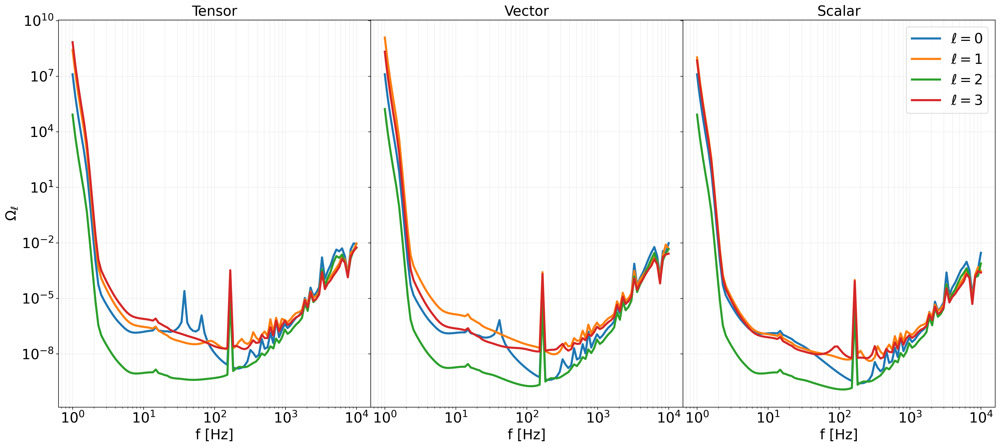

In [232]:
fig, axs = plt.subplots(1, 3, figsize=(24, 10), sharey=True)

plt.subplots_adjust(wspace=0, hspace=0)

axs[0].loglog(f, N0_ET_t, label=r'$\ell=0$')
axs[0].loglog(f, N1_ET_t, label=r'$\ell=1$')
axs[0].loglog(f, N2_ET_t, label=r'$\ell=2$')
axs[0].loglog(f, N3_ET_t, label=r'$\ell=3$')
#axs[0].legend()
axs[0].set_xlabel('f [Hz]')
axs[0].set_ylabel(r'$\Omega_{\ell}$')
axs[0].set_title('Tensor')
axs[0].grid(True, which='both', alpha=0.2)

axs[1].loglog(f, N0_ET_v, label=r'$\ell=0$')
axs[1].loglog(f, N1_ET_v, label=r'$\ell=1$')
axs[1].loglog(f, N2_ET_v, label=r'$\ell=2$')
axs[1].loglog(f, N3_ET_v, label=r'$\ell=3$')
#axs[1].legend()
axs[1].set_xlabel('f [Hz]')
axs[1].set_title('Vector')
axs[1].grid(True, which='both', alpha=0.2)

axs[2].loglog(f, N0_ET_s, label=r'$\ell=0$')
axs[2].loglog(f, N1_ET_s, label=r'$\ell=1$')
axs[2].loglog(f, N2_ET_s, label=r'$\ell=2$')
axs[2].loglog(f, N3_ET_s, label=r'$\ell=3$')
axs[2].legend()
axs[2].set_xlabel('f [Hz]')
axs[2].set_title('Scalar')
axs[2].grid(True, which='both', alpha=0.2)

# LISA

 check to see if everything works fine

cross
0.149968500514768
auto
0.299937012800409


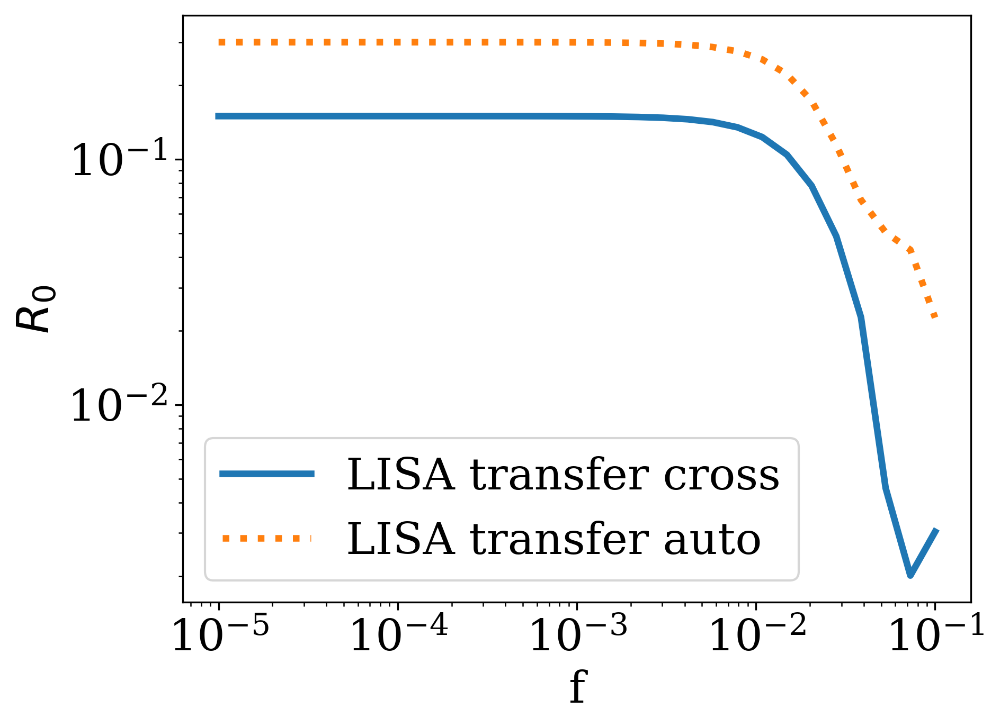

In [12]:
ecX, e1X, e2X, l, name = det.detector('LISA 1', shift_angle=None)
ecY, e1Y, e2Y, l, name = det.detector('LISA 2', shift_angle=None)

f = np.logspace(-5,-1, 30) #, PSD = det.detector_Pn('LIGO H')

# this is the XYZ BASIS

R0_LISA_transfer_cross = 2/5*R_ell_transfer(0, ecX, e1X, e2X, ecY, e1Y, e2Y, c, f, 't', l)
R0_LISA_transfer_auto = 2/5*R_ell_transfer(0, ecX, e1X, e2X, ecX, e1X, e2X, c, f, 't', l)

print('cross')
print(R0_LISA_transfer_cross[0]) # 3/20 as in literature (small frequency limit)


print('auto')
print(R0_LISA_transfer_auto[0]) # 3/10 as in literature (small frequency limit). 


plt.loglog(f, R0_LISA_transfer_cross, label='LISA transfer cross')
plt.loglog(f, R0_LISA_transfer_auto, linestyle='dotted', label='LISA transfer auto')
plt.xlabel('f')
plt.ylabel(r'$R_{0}$')
plt.legend()
plt.show()

For even $\ell$ :


\begin{equation*}
R_{AA}^{\ell} =  R_{EE}^{\ell} = \left[ \frac{1}{4} \sum_{m= -\ell}^{+ \ell} \left| (1 + e^{-4/3 i m \pi}) R_{XX}^{\ell m} - 2 R_{XY}^{\ell m } \right|^2 \right]^{1/2}
\end{equation*}

\begin{equation*}
R_{TT}^{\ell} = \left[ \frac{1}{9} \sum_{m= -\ell}^{+ \ell} \left[  1+ 2\cos \left( \frac{2 m \pi}{3} \right)\right]^2 \left|  R_{XX}^{\ell m} + 2 R_{XY}^{\ell m } \right|^2 \right]^{1/2}
\end{equation*}

\begin{equation*}
R_{AE}^{\ell} = \left[ \frac{1}{3} \sum_{m= -\ell}^{+ \ell} \sin^2 \left( \frac{m \pi}{3} \right) \left| (1 + e^{2/3 i m \pi}) R_{XX}^{\ell m} - 2 R_{XY}^{\ell m } \right|^2 \right]^{1/2}
\end{equation*}

\begin{equation*}
R_{AT}^{\ell} = R_{ET}^{\ell} \left[ \frac{2}{3} \sum_{m= -\ell}^{+ \ell} \sin^2 \left( \frac{m \pi}{3} \right) \left| (1 + e^{2/3 i m \pi}) R_{XX}^{\ell m} + 2 R_{XY}^{\ell m } \right|^2 \right]^{1/2}
\end{equation*}

and for odd $\ell$ instead

\begin{equation*}
R_{AA}^{\ell} (f) =  R_{EE}^{\ell} (f) = R_{TT}^{\ell} (f) = 0,
\end{equation*}

\begin{equation*}
    R_{AE}^{\ell} (f) = \left[ \frac{1}{3} \sum_{m= -\ell}^{\ell} \left[ 
    1 + 2\cos \left( \frac{2 m \pi}{3} \right)\right]^2 \left|R_{XY}^{\ell m} (f) \right|^2 \right]^{1/2},
\end{equation*}

\begin{equation*}
    R_{AT}^{\ell} (f) = R_{ET}^{\ell} (f) =  \left[ \frac{1}{3} \sum_{m= -\ell}^{\ell} \sin^2 \left( \frac{m\pi}{3} \right) \left|R_{XY}^{\ell m} (f) \right|^2 \right]^{1/2}.
\end{equation*}


In [13]:
# even l values

def R_AET_basis(l, channel, pol, f):
    
    c1, u1, v1, L, name = det.detector('LISA 1', shift_angle=None)
    c2, u2, v2, L, name = det.detector('LISA 2', shift_angle=None)

    # if l is even statement
    if l % 2 == 0:

        def R_AA_ell(l, c1, u1, v1, c2, u2, v2, c, f, pol, L):
            m_values = np.arange(-l, l+1)
            total = 0
            psi = 0 
            for m in m_values:
                total += np.abs((1 + np.exp(-4j*np.pi*m/3))*Rlm_transfer(l, m, u1, v1, c1, u1, v1, c1, psi, f, pol, L)
                                - 2*Rlm_transfer(l, m, u1, v1, c1, u2, v2, c2, psi, f, pol, L)) **2
            return np.sqrt(total/4)

        def R_TT_ell(l, c1, u1, v1, c2, u2, v2, c, f, pol, L):
            m_values = np.arange(-l, l+1)
            total = 0
            psi = 0 
            for m in m_values:
                total += (1 + np.cos(2*np.pi*m/3))**2 * np.abs(Rlm_transfer(l, m, u1, v1, c1, u1, v1, c1, psi, f, pol, L)
                                                            + 2*Rlm_transfer(l, m, u1, v1, c1, u2, v2, c2, psi, f, pol, L) )**2
            return np.sqrt(total/9)

        def R_AE_ell(l, c1, u1, v1, c2, u2, v2, c, f, pol, L):
            m_values = np.arange(-l, l+1)
            total = 0
            psi = 0 
            for m in m_values:
                total += np.sin(np.pi*m/3)**2 * np.abs((1 + np.exp(-4j*np.pi*m/3))*Rlm_transfer(l, m, u1, v1, c1, u1, v1, c1, psi, f, pol, L)
                                - 2*Rlm_transfer(l, m, u1, v1, c1, u2, v2, c2, psi, f, pol, L)) **2
            return np.sqrt(total/3)

        def R_AT_ell(l, c1, u1, v1, c2, u2, v2, c, f, pol, L):
            m_values = np.arange(-l, l+1)
            total = 0
            psi = 0 
            for m in m_values:
                total += np.sin(np.pi*m/3)**2 * np.abs((1 + np.exp(-4j*np.pi*m/3))*Rlm_transfer(l, m, u1, v1, c1, u1, v1, c1, psi, f, pol, L)
                                + 2*Rlm_transfer(l, m, u1, v1, c1, u2, v2, c2, psi, f, pol, L)) **2
            return np.sqrt(2*total/3)
        
        if channel == 'AA' or channel=='EE':
            return R_AA_ell(l, c1, u1, v1, c2, u2, v2, c, f, pol, L)
        elif channel == 'TT':
            return R_TT_ell(l, c1, u1, v1, c2, u2, v2, c, f, pol, L)
        elif channel == 'AE':
            return R_AE_ell(l, c1, u1, v1, c2, u2, v2, c, f, pol, L)
        elif channel == 'AT' or 'ET':
            return R_AT_ell(l, c1, u1, v1, c2, u2, v2, c, f, pol, L)
        
    else:
        
        def R_AA_ell(f):
            return np.zeros(len(f))
        
        def R_AE_ell(l, c1, u1, v1, c2, u2, v2, c, f, pol, L):
            m_values = np.arange(-l, l+1)
            total = 0
            psi = 0 
            for m in m_values:
                total += (1 + np.cos(2*np.pi*m/3**2))**2 * np.abs(Rlm_transfer(l, m, u1, v1, c1, u2, v2, c2, psi, f, pol, L) )**2
            return np.sqrt(total/3) 
        
        def R_AT_ell(l, c1, u1, v1, c2, u2, v2, c, f, pol, Ll):
            m_values = np.arange(-l, l+1)
            total = 0
            psi = 0 
            for m in m_values:
                total += np.sin(np.pi*m/3)**2 * np.abs(Rlm_transfer(l, m, u1, v1, c1, u2, v2, c2, psi, f, pol, L) )**2
            return np.sqrt(2*total)
        
        if channel == 'AA' or channel == 'EE' or channel == 'TT':
            return R_AA_ell(f)
        elif channel == 'AE':
            return R_AE_ell(l, c1, u1, v1, c2, u2, v2, c, f, pol, L)
        elif channel == 'AT' or channel=='ET':
            return R_AT_ell(l, c1, u1, v1, c2, u2, v2, c, f, pol, L)

            



In [14]:
print('Computing l = 0 ...')

Rl_0_AA_t = R_AET_basis(0, 'AA', 't', f)
Rl_0_AA_v = R_AET_basis(0, 'AA', 'v', f)
Rl_0_AA_s = R_AET_basis(0, 'AA', 's', f)

Rl_0_AE_t = R_AET_basis(0, 'AE', 't', f)
Rl_0_AE_v = R_AET_basis(0, 'AE', 'v', f)
Rl_0_AE_s = R_AET_basis(0, 'AE', 's', f)

Rl_0_AT_t = R_AET_basis(0, 'AT', 't', f)
Rl_0_AT_v = R_AET_basis(0, 'AT', 'v', f)
Rl_0_AT_s = R_AET_basis(0, 'AT', 's', f)

Rl_0_TT_t = R_AET_basis(0, 'TT', 't', f)
Rl_0_TT_v = R_AET_basis(0, 'TT', 'v', f)
Rl_0_TT_s = R_AET_basis(0, 'TT', 's', f)

print('Computing l = 1 ...')

Rl_1_AE_t = R_AET_basis(1, 'AE', 't', f)
Rl_1_AE_v = R_AET_basis(1, 'AE', 'v', f)
Rl_1_AE_s = R_AET_basis(1, 'AE', 's', f)

Rl_1_AT_t = R_AET_basis(1, 'AT', 't', f)
Rl_1_AT_v = R_AET_basis(1, 'AT', 'v', f)
Rl_1_AT_s = R_AET_basis(1, 'AT', 's', f)

print('Computing l = 2 ...')

Rl_2_AA_t = R_AET_basis(2, 'AA', 't', f)
Rl_2_AA_v = R_AET_basis(2, 'AA', 'v', f)
Rl_2_AA_s = R_AET_basis(2, 'AA', 's', f)

Rl_2_AE_t = R_AET_basis(2, 'AE', 't', f)
Rl_2_AE_v = R_AET_basis(2, 'AE', 'v', f)
Rl_2_AE_s = R_AET_basis(2, 'AE', 's', f)

Rl_2_AT_t = R_AET_basis(2, 'AT', 't', f)
Rl_2_AT_v = R_AET_basis(2, 'AT', 'v', f)
Rl_2_AT_s = R_AET_basis(2, 'AT', 's', f)

Rl_2_TT_t = R_AET_basis(2, 'TT', 't', f)
Rl_2_TT_v = R_AET_basis(2, 'TT', 'v', f)
Rl_2_TT_s = R_AET_basis(2, 'TT', 's', f)

print('Computing l = 3 ...')

Rl_3_AE_t = R_AET_basis(3, 'AE', 't', f)
Rl_3_AE_v = R_AET_basis(3, 'AE', 'v', f)
Rl_3_AE_s = R_AET_basis(3, 'AE', 's', f)

Rl_3_AT_t = R_AET_basis(3, 'AT', 't', f)
Rl_3_AT_v = R_AET_basis(3, 'AT', 'v', f)
Rl_3_AT_s = R_AET_basis(3, 'AT', 's', f)



Computing l = 0 ...
Computing l = 1 ...
Computing l = 2 ...


KeyboardInterrupt: 

In [16]:
LISA_Rell = {0:{},
            1:{},
            2:{},
            3:{}}

for ell in tqdm(LISA_Rell.keys()):
    for ch in ['AA', 'AE', 'AT', 'TT']:
        if ch not in LISA_Rell[ell]:
            LISA_Rell[ell][ch] = {}
        for pol in ['t', 'v', 's']:
            LISA_Rell[ell][ch][pol] = R_AET_basis(ell, ch, pol, f)

with open('LISA_Rell.pkl', 'wb') as f:
    pickle.dump(LISA_Rell, f)

  0%|          | 0/4 [00:00<?, ?it/s]

100%|██████████| 4/4 [16:24<00:00, 246.24s/it]


NameError: name 'pickle' is not defined

Text(0, 0.5, '$R_{\\ell}$')

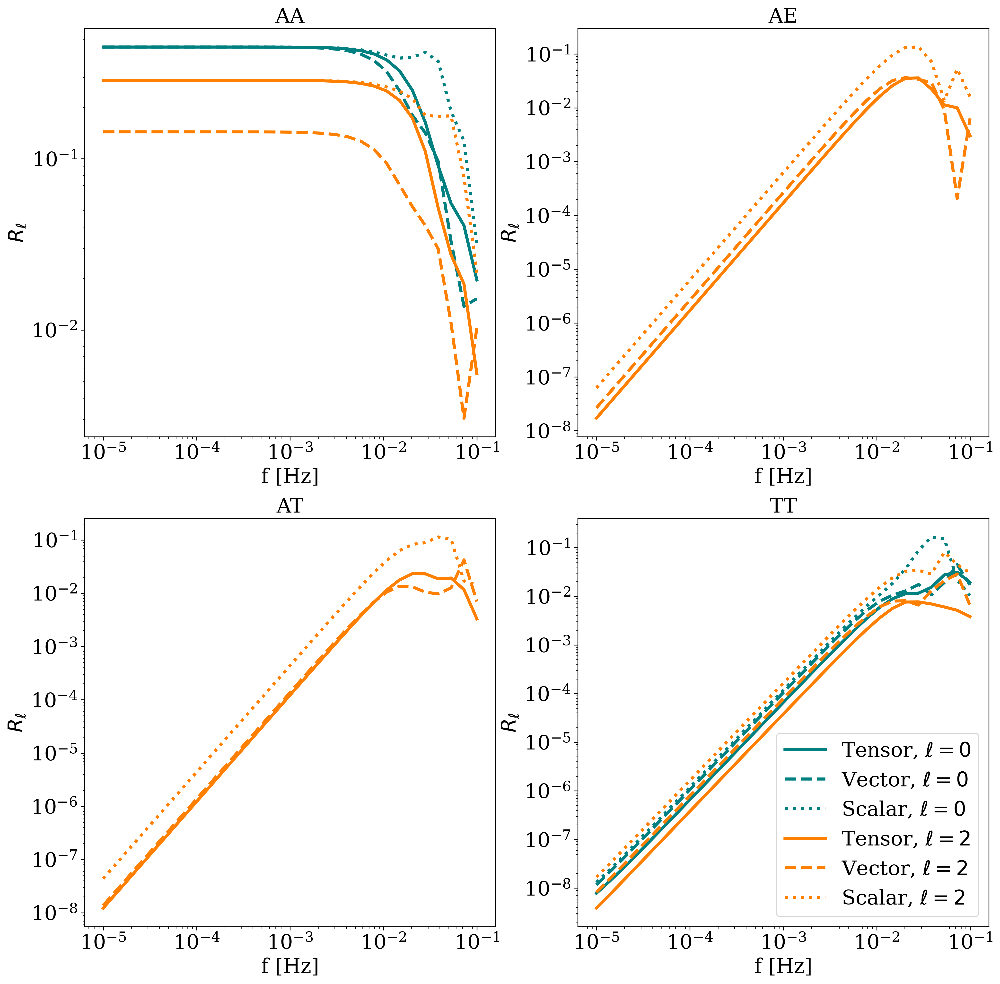

In [18]:
# plot for even l 
f = np.logspace(-5,-1, 30)
fig, axs = plt.subplots(2, 2, figsize=(16, 16))

axs[0, 0].loglog(f, 2/5*LISA_Rell[0]['AA']['t'], color=(0, 0.5, 0.5), label=r'Tensor, $\ell = 0$')
axs[0, 0].loglog(f, 2/5*LISA_Rell[0]['AA']['v'], color=(0, 0.5, 0.5), label=r'Vector, $\ell = 0$', linestyle='--')
axs[0, 0].loglog(f, 2/5*LISA_Rell[0]['AA']['s'], color=(0, 0.5, 0.5), label=r'Scalar, $\ell = 0$', linestyle=':')
axs[0, 0].loglog(f, 2/5*LISA_Rell[2]['AA']['t'], color=(1, 0.5, 0), label=r'Tensor, $\ell = 2$')
axs[0, 0].loglog(f, 2/5*LISA_Rell[2]['AA']['v'], color=(1, 0.5, 0), label=r'Vector, $\ell = 2$', linestyle='--')
axs[0, 0].loglog(f, 2/5*LISA_Rell[2]['AA']['s'], color=(1, 0.5, 0), label=r'Scalar, $\ell = 2$', linestyle=':')
axs[0, 0].set_title(r'AA')
#axs[0, 0].legend()
axs[0, 0].set_xlabel('f [Hz]')
axs[0, 0].set_ylabel(r'$R_{\ell}$')

axs[0, 1].loglog(f, 2/5*LISA_Rell[0]['AE']['t'], color=(0, 0.5, 0.5), label=r'Tensor, $\ell = 0$')
axs[0, 1].loglog(f, 2/5*LISA_Rell[0]['AE']['v'], color=(0, 0.5, 0.5), label=r'Vector, $\ell = 0$', linestyle='--')
axs[0, 1].loglog(f, 2/5*LISA_Rell[0]['AE']['s'], color=(0, 0.5, 0.5), label=r'Scalar, $\ell = 0$', linestyle=':')
axs[0, 1].loglog(f, 2/5*LISA_Rell[2]['AE']['t'], color=(1, 0.5, 0), label=r'Tensor, $\ell = 2$')
axs[0, 1].loglog(f, 2/5*LISA_Rell[2]['AE']['v'], color=(1, 0.5, 0), label=r'Vector, $\ell = 2$', linestyle='--')
axs[0, 1].loglog(f, 2/5*LISA_Rell[2]['AE']['s'], color=(1, 0.5, 0), label=r'Scalar, $\ell = 2$', linestyle=':')
axs[0, 1].set_title(r'AE')
#axs[0, 1].legend()
axs[0, 1].set_xlabel('f [Hz]')
axs[0, 1].set_ylabel(r'$R_{\ell}$')

axs[1, 0].loglog(f, 2/5*LISA_Rell[0]['AT']['t'], color=(0, 0.5, 0.5), label=r'Tensor, $\ell = 0$')
axs[1, 0].loglog(f, 2/5*LISA_Rell[0]['AT']['v'], color=(0, 0.5, 0.5), label=r'Vector, $\ell = 0$', linestyle='--')
axs[1, 0].loglog(f, 2/5*LISA_Rell[0]['AT']['s'], color=(0, 0.5, 0.5), label=r'Scalar, $\ell = 0$', linestyle=':')
axs[1, 0].loglog(f, 2/5*LISA_Rell[2]['AT']['t'], color=(1, 0.5, 0), label=r'Tensor, $\ell = 2$')
axs[1, 0].loglog(f, 2/5*LISA_Rell[2]['AT']['v'], color=(1, 0.5, 0), label=r'Vector, $\ell = 2$', linestyle='--')
axs[1, 0].loglog(f, 2/5*LISA_Rell[2]['AT']['s'], color=(1, 0.5, 0), label=r'Scalar, $\ell = 2$', linestyle=':')
axs[1, 0].set_title(r'AT')
#axs[1, 0].legend()
axs[1, 0].set_xlabel('f [Hz]')
axs[1, 0].set_ylabel(r'$R_{\ell}$')

axs[1, 1].loglog(f, 2/5*LISA_Rell[0]['TT']['t'], color=(0, 0.5, 0.5), label=r'Tensor, $\ell = 0$')
axs[1, 1].loglog(f, 2/5*LISA_Rell[0]['TT']['v'], color=(0, 0.5, 0.5), label=r'Vector, $\ell = 0$', linestyle='--')
axs[1, 1].loglog(f, 2/5*LISA_Rell[0]['TT']['s'], color=(0, 0.5, 0.5), label=r'Scalar, $\ell = 0$', linestyle=':')
axs[1, 1].loglog(f, 2/5*LISA_Rell[2]['TT']['t'], color=(1, 0.5, 0), label=r'Tensor, $\ell = 2$')
axs[1, 1].loglog(f, 2/5*LISA_Rell[2]['TT']['v'], color=(1, 0.5, 0), label=r'Vector, $\ell = 2$', linestyle='--')
axs[1, 1].loglog(f, 2/5*LISA_Rell[2]['TT']['s'], color=(1, 0.5, 0), label=r'Scalar, $\ell = 2$', linestyle=':')
axs[1, 1].set_title(r'TT')
axs[1, 1].legend()
axs[1, 1].set_xlabel('f [Hz]')
axs[1, 1].set_ylabel(r'$R_{\ell}$')



Text(0, 0.5, '$R_{\\ell}$')

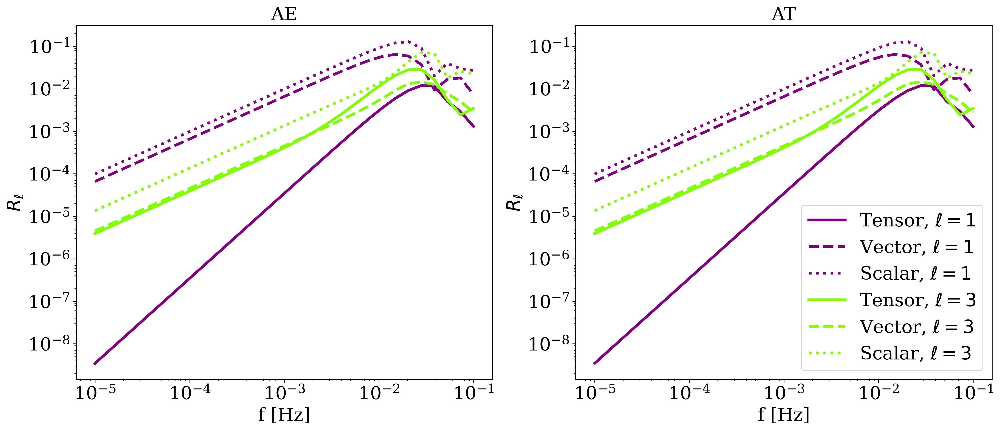

In [19]:
# plot for odd l

fig, axs = plt.subplots(1, 2, figsize=(18, 7))

axs[0].loglog(f, 2/5*LISA_Rell[1]['AE']['t'], color=(0.5, 0, 0.5), label=r'Tensor, $\ell = 1$')
axs[0].loglog(f, 2/5*LISA_Rell[1]['AE']['v'], color=(0.5, 0, 0.5), label=r'Vector, $\ell = 1$', linestyle='--')
axs[0].loglog(f, 2/5*LISA_Rell[1]['AE']['s'], color=(0.5, 0, 0.5), label=r'Scalar, $\ell = 1$', linestyle=':')
axs[0].loglog(f, 2/5*LISA_Rell[3]['AE']['t'], color=(0.5, 1, 0), label=r'Tensor, $\ell = 3$')
axs[0].loglog(f, 2/5*LISA_Rell[3]['AE']['v'], color=(0.5, 1, 0), label=r'Vector, $\ell = 3$', linestyle='--')
axs[0].loglog(f, 2/5*LISA_Rell[3]['AE']['s'], color=(0.5, 1, 0), label=r'Scalar, $\ell = 3$', linestyle=':')
axs[0].set_title(r'AE')
#axs[0].legend()
axs[0].set_xlabel('f [Hz]')
axs[0].set_ylabel(r'$R_{\ell}$')

axs[1].loglog(f, 2/5*LISA_Rell[1]['AE']['t'], color=(0.5, 0, 0.5), label=r'Tensor, $\ell = 1$')
axs[1].loglog(f, 2/5*LISA_Rell[1]['AE']['v'], color=(0.5, 0, 0.5), label=r'Vector, $\ell = 1$', linestyle='--')
axs[1].loglog(f, 2/5*LISA_Rell[1]['AE']['s'], color=(0.5, 0, 0.5), label=r'Scalar, $\ell = 1$', linestyle=':')
axs[1].loglog(f, 2/5*LISA_Rell[3]['AE']['t'], color=(0.5, 1, 0), label=r'Tensor, $\ell = 3$')
axs[1].loglog(f, 2/5*LISA_Rell[3]['AE']['v'], color=(0.5, 1, 0), label=r'Vector, $\ell = 3$', linestyle='--')
axs[1].loglog(f, 2/5*LISA_Rell[3]['AE']['s'], color=(0.5, 1, 0), label=r'Scalar, $\ell = 3$', linestyle=':')
axs[1].set_title(r'AT')
axs[1].legend()
axs[1].set_xlabel('f [Hz]')
axs[1].set_ylabel(r'$R_{\ell}$')



In [12]:
# Bartolo et al. 2022 eq.4.43

def Omega_l_LISA(f, l, pol):

    if l % 2 == 0:

        Rl_AA = 2/5*R_AET_basis(l, 'AA', pol, f)
        Rl_TT =  2/5*R_AET_basis(l, 'TT', pol, f)

        Nl_AA = Nl_EE = Omega_l('LISA 1', 'LISA 1', Rl_AA, f)
        Nl_TT = Omega_l('LISA 1', 'LISA 1', Rl_TT, f)

        return np.sqrt(1 / ( 1/Nl_AA**2 + 1/Nl_EE**2 + 1/Nl_TT**2))
    
    else:
        
        Rl_AE =   2/5*R_AET_basis(l, 'AE', pol, f)
        Rl_AT =   2/5*R_AET_basis(l, 'AT', pol, f)
        
        Nl_AE = Omega_l('LISA 1', 'LISA 1', Rl_AE, f)
        Nl_AT = Nl_ET = Omega_l('LISA 1', 'LISA 1', Rl_AT, f)

        return np.sqrt(1 / ( 1/Nl_AE**2 + 1/Nl_AT**2 + 1/Nl_ET**2))



In [13]:
N0_t = Omega_l_LISA(f, 0, 't')
N1_t = Omega_l_LISA(f, 1, 't')
N2_t = Omega_l_LISA(f, 2, 't')
N3_t = Omega_l_LISA(f, 3, 't')

N0_v = Omega_l_LISA(f, 0, 'v')
N1_v = Omega_l_LISA(f, 1, 'v')
N2_v = Omega_l_LISA(f, 2, 'v')
N3_v = Omega_l_LISA(f, 3, 'v')

N0_s = Omega_l_LISA(f, 0, 's')
N1_s = Omega_l_LISA(f, 1, 's')
N2_s = Omega_l_LISA(f, 2, 's')
N3_s = Omega_l_LISA(f, 3, 's')

NameError: name 'Omega_l' is not defined

2.46404674279608e-11


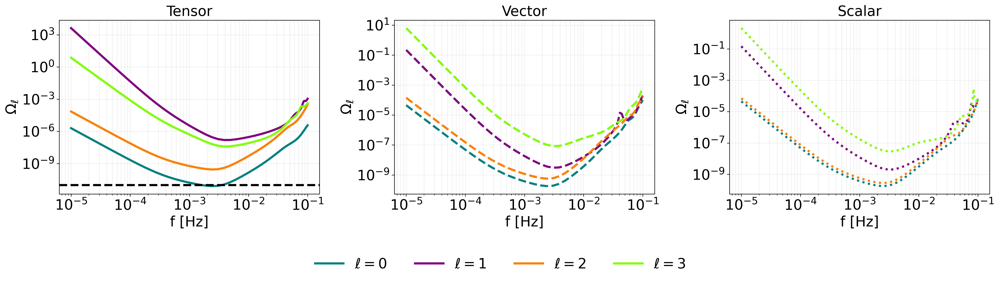

In [134]:
fig, axs = plt.subplots(1, 3, figsize=(20, 5))
f = np.unique(np.concatenate((np.logspace(-5, -2, 30),np.linspace(1e-2,1e-1,30))))

print(min(0.49/(np.sqrt(4* np.pi))*N0_t))


# Tensor plot
axs[0].plot(f, 0.49/(np.sqrt(4* np.pi))*N0_t/np.pi, label=r'$\ell=0$', color=(0, 0.5, 0.5))
axs[0].plot(f, N1_t, label=r'$\ell=1$', color=(0.5, 0, 0.5))
axs[0].plot(f, N2_t, label=r'$\ell=2$', color=(1, 0.5, 0))
axs[0].plot(f, N3_t, label=r'$\ell=3$', color=(0.5, 1, 0))
axs[0].set_xscale('log')
axs[0].set_yscale('log')
axs[0].set_xlabel('f [Hz]')
axs[0].set_ylabel(r'$\Omega_{\ell}$')
axs[0].set_title('Tensor')
axs[0].grid(True, which='both', alpha=0.2)
axs[0].axhline(1e-11, color='black', linestyle='--')

# Vector plot
axs[1].plot(f, N0_v, label=r'$\ell=0$', linestyle='--', color=(0, 0.5, 0.5))
axs[1].plot(f, N1_v, label=r'$\ell=1$', linestyle='--', color=(0.5, 0, 0.5))
axs[1].plot(f, N2_v, label=r'$\ell=2$', linestyle='--', color=(1, 0.5, 0))
axs[1].plot(f, N3_v, label=r'$\ell=3$', linestyle='--', color=(0.5, 1, 0))
axs[1].set_xscale('log')
axs[1].set_yscale('log')
axs[1].set_xlabel('f [Hz]')
axs[1].set_ylabel(r'$\Omega_{\ell}$')
axs[1].set_title('Vector')
axs[1].grid(True, which='both', alpha=0.2)

# Scalar plot
axs[2].plot(f, N0_s, label=r'$\ell=0$', linestyle=':', color=(0, 0.5, 0.5))
axs[2].plot(f, N1_s, label=r'$\ell=1$', linestyle=':',  color=(0.5, 0, 0.5))
axs[2].plot(f, N2_s, label=r'$\ell=2$', linestyle=':', color=(1, 0.5, 0))
axs[2].plot(f, N3_s, label=r'$\ell=3$', linestyle=':', color=(0.5, 1, 0))
axs[2].set_xscale('log')
axs[2].set_yscale('log')
axs[2].set_xlabel('f [Hz]')
axs[2].set_ylabel(r'$\Omega_{\ell}$')
axs[2].set_title('Scalar')
axs[2].grid(True, which='both', alpha=0.2)

# Legend
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, -0.0005), fancybox=True, shadow=True, ncol=4, frameon=False)

plt.tight_layout()
plt.show()

In [133]:
2.46404674279608e-11/np.pi

7.843304382509604e-12